In [1]:
# Importar as bibliotecas necessárias
import os
import time
import numpy as np
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.transforms import functional as F
from PIL import Image
from tqdm import tqdm
from matplotlib import pyplot as plt

# Verificar se CUDA está disponível e definir o dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando o dispositivo: {device}")

# Definir as cores para as classes
CLASS_COLORS = { 
    'Doenca': (255, 0, 0), 
    'Saudavel': (0, 255, 0), 
    'Solo': (0, 0, 255),
    'Fundo': (0, 0, 0)
}

Usando o dispositivo: cuda


In [2]:
#definicao dos hiperparametros.
criterion = nn.CrossEntropyLoss()  # Considerando que temos múltiplas classes
learning_rate = 0.001
num_epochs = 300
patience = 30
batch_size = 64

In [3]:
# Classe do Dataset personalizado
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.image_dir, img_name)
        
        # Modificar a extensão da máscara para '.png'
        mask_name = os.path.splitext(img_name)[0] + '.png'
        mask_path = os.path.join(self.mask_dir, mask_name)
        
        # Carregar a imagem e a máscara
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")
        
        if self.transform:
            # Aplicar transformações, se houver
            image = self.transform(image)
            mask = self.transform(mask)
            
        # Convertemos as máscaras de imagem em um array de índices de classe
        mask = self.mask_to_class(mask)
        
        return image, mask
    
    def mask_to_class(self, mask):
        # Converte a máscara para um array NumPy e ajusta para escala de 0 a 255
        mask_array = (np.array(mask, dtype=np.float32) * 255).astype(np.uint8)

        # Garantir que esté em [H, W, C]
        if mask_array.shape[0] == 3:
            mask_array = mask_array.transpose(1, 2, 0)

        mask_indices = np.zeros((mask_array.shape[0], mask_array.shape[1]), dtype=np.int64)

        for i, color in enumerate(CLASS_COLORS.values()):
            # Realizar comparação e detecção de igualdade entre pixels
            equal_color = np.all(mask_array == color, axis=-1)
            mask_indices[equal_color] = i

        return torch.tensor(mask_indices, dtype=torch.long)

# Função para criar transformações de dados normais e de aumento de dados
def get_transforms():
    return transforms.Compose([
        transforms.Resize((256, 256)),  # Redimensiona para uma dimensão adequada para o modelo
        transforms.ToTensor(),  # Normaliza para [0, 1]
    ])

# Outras inicializações de datasets e dataloaders
train_dataset = SegmentationDataset(
    image_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/base/Train",
    mask_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/masks/Train",
    transform=get_transforms()
)

val_dataset = SegmentationDataset(
    image_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/base/Val",
    mask_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/masks/Val",
    transform=get_transforms()
)

test_dataset = SegmentationDataset(
    image_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/base/Test",
    mask_dir="E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/dataset/masks/Test",
    transform=get_transforms()
)

# Criar os DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print("Dados carregados e preparados.")

Dados carregados e preparados.


In [4]:
# Importar a biblioteca segmentation-models-pytorch
!pip install segmentation-models-pytorch --quiet

import segmentation_models_pytorch as smp

# Inicializar as arquiteturas dos modelos com os pesos pretreinados por padrão
unet = smp.Unet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)
pspnet = smp.PSPNet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)
linknet = smp.Linknet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)
deeplabv3 = smp.DeepLabV3(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=len(CLASS_COLORS)).to(device)

models = {
    'U-Net': unet,
    'PSPNet': pspnet,
    'LinkNet': linknet,
    'DeepLabV3': deeplabv3
}

print("Modelos configurados e prontos para treinamento.")

c:\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Modelos configurados e prontos para treinamento.


In [5]:
import torch
import torchmetrics
import numpy as np
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassF1Score, MulticlassPrecision

def compute_dice_coefficient(preds, targets):
    """
    Calcula o coeficiente de Dice
    """
    intersection = (preds * targets).sum()
    dice = (2. * intersection) / (preds.sum() + targets.sum())
    return dice.item()

def compute_aji(preds, targets):
    """
    Calcula o índice de Jaccard agregado (AJI)
    """
    preds = preds.detach().cpu().numpy().astype(np.bool_)
    targets = targets.detach().cpu().numpy().astype(np.bool_)
    
    # Calcula o Jaccard para cada componente individual nos targets/preds
    intersection = np.logical_and(preds, targets)
    union = np.logical_or(preds, targets)
    jaccard_per_class = intersection.sum() / (union.sum() + 1e-10)  # Evitar divisão por zero
    return jaccard_per_class

# Configurar as métricas, incluindo Dice e AJI personalizados
metrics = {
    'F1': MulticlassF1Score(num_classes=len(CLASS_COLORS)).to(device),
    'Jaccard': MulticlassJaccardIndex(num_classes=len(CLASS_COLORS)).to(device),
    'Precision': MulticlassPrecision(num_classes=len(CLASS_COLORS)).to(device),
    'Dice': compute_dice_coefficient,
    'AJI': compute_aji
}

In [6]:
import csv
import time
import os

# Diretório para salvar os resultados
results_dir = "E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/results/data"
os.makedirs(results_dir, exist_ok=True)

def train_model_with_early_stopping(model, train_loader, val_loader, criterion, optimizer, metrics, num_epochs, device, patience, model_name, results_dir):
    since = time.time()
    best_model_wts = model.state_dict()
    best_loss = float('inf')
    patience_counter = 0
    epochs_run = 0  # Variável para contar as épocas realizadas

    # Variáveis para armazenar tempos de execução
    training_time = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)
        
        epochs_run += 1  # Registrar a execução da época

        epoch_start = time.time()  # Marcar o início da época

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                data_loader = train_loader
            else:
                model.eval()
                data_loader = val_loader

            running_loss = 0.0
            running_metrics = {key: 0 for key in metrics.keys()}
            
            for inputs, masks in tqdm(data_loader):
                inputs, masks = inputs.to(device), masks.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, masks)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)

                for metric_name, metric in metrics.items():
                    if metric_name in ['Dice', 'AJI']:
                        value = metric(preds, masks)
                    else:  # Para métricas torchmetrics
                        value = metric(preds, masks).item()
                    running_metrics[metric_name] += value * inputs.size(0)

            epoch_loss = running_loss / len(data_loader.dataset)
            epoch_metrics = {key: value / len(data_loader.dataset) for key, value in running_metrics.items()}

            print(f'{phase} Loss: {epoch_loss:.4f}')
            for metric_name in metrics:
                print(f'{phase} {metric_name}: {epoch_metrics[metric_name]:.4f}')

            if phase == 'val':
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = model.state_dict()
                    patience_counter = 0
                else:
                    patience_counter += 1

        epoch_end = time.time()  # Marcar o fim da época
        epoch_time = epoch_end - epoch_start
        training_time += epoch_time  # Acumular tempos totais
        print(f'Epoch time: {epoch_time:.2f} seconds')

        print(f'Patience counter: {patience_counter}')

        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val loss: {best_loss:.4f}')
    print(f'Total epochs run: {epochs_run}')

    # Restaurar o melhor modelo
    model.load_state_dict(best_model_wts)

    # Salvar o modelo treinado
    model_path = os.path.join(results_dir, f'{model_name}_best.pth')
    torch.save(model.state_dict(), model_path)

    # Coletar as métricas finais
    final_metrics = epoch_metrics
    final_metrics['best_loss'] = best_loss
    final_metrics['training_time'] = time_elapsed
    final_metrics['epochs_run'] = epochs_run

    # Salvar todas as métricas para CSV
    csv_path = os.path.join(results_dir, 'results.csv')
    write_metrics_to_csv(csv_path, model_name, final_metrics)

    return model

def write_metrics_to_csv(csv_path, model_name, metrics):
    headers = ['nome', 'f1-score', 'indice jaccard', 'precision', 'dice', 'aji', 'best_loss', 'training_time', 'epochs_run']
    row = [
        model_name,
        metrics['F1'],
        metrics['Jaccard'],
        metrics['Precision'],
        metrics['Dice'],
        metrics['AJI'],
        metrics['best_loss'],
        metrics['training_time'],
        metrics['epochs_run']
    ]

    file_exists = os.path.isfile(csv_path)

    with open(csv_path, mode='a', newline='') as f:
        writer = csv.writer(f)
        if not file_exists:
            writer.writerow(headers)  # Escrever cabeçalhos se o arquivo não existe
        writer.writerow(row)  # Salvar linha de métricas

# Definir um otimizador para cada modelo
optimizers = {
    model_name: torch.optim.Adam(model.parameters(), lr=learning_rate) 
    for model_name, model in models.items()
}

# Executar o Treinamento dos Modelos
for model_name, model in models.items():
    print("*********************************************************************")
    print(f"Treinando {model_name} com early stopping.")
    trained_model = train_model_with_early_stopping(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        optimizer=optimizers[model_name],
        metrics=metrics,
        num_epochs=num_epochs,
        device=device,
        patience=patience,
        model_name=model_name,
        results_dir=results_dir
    )
    print(f'{model_name} treinado e salvo com sucesso.')

print("Treinamento completo de todos os modelos com early stopping.")

*********************************************************************
Treinando U-Net com early stopping.
Epoch 1/300
----------


100%|██████████| 2/2 [00:18<00:00,  9.13s/it]


train Loss: 1.6267
train F1: 0.2016
train Jaccard: 0.1168
train Precision: 0.2453
train Dice: 1.8907
train AJI: 0.6690


100%|██████████| 1/1 [00:08<00:00,  8.19s/it]


val Loss: 2.1554
val F1: 0.0978
val Jaccard: 0.0570
val Precision: 0.2388
val Dice: 0.1962
val AJI: 0.0371
Epoch time: 26.47 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.06s/it]


train Loss: 1.2636
train F1: 0.3346
train Jaccard: 0.2082
train Precision: 0.4070
train Dice: 2.0129
train AJI: 0.7339


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 2.9645
val F1: 0.1564
val Jaccard: 0.0926
val Precision: 0.2358
val Dice: 2.0762
val AJI: 0.7546
Epoch time: 23.97 seconds
Patience counter: 1
Epoch 3/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 1.0579
train F1: 0.5303
train Jaccard: 0.3816
train Precision: 0.5626
train Dice: 2.0342
train AJI: 0.7600


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


val Loss: 4.9698
val F1: 0.1336
val Jaccard: 0.0813
val Precision: 0.2599
val Dice: 2.1531
val AJI: 0.7971
Epoch time: 23.99 seconds
Patience counter: 2
Epoch 4/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.9208
train F1: 0.6044
train Jaccard: 0.4649
train Precision: 0.6171
train Dice: 2.0266
train AJI: 0.7701


100%|██████████| 1/1 [00:07<00:00,  7.76s/it]


val Loss: 2.5330
val F1: 0.2267
val Jaccard: 0.1412
val Precision: 0.3068
val Dice: 2.1037
val AJI: 0.8023
Epoch time: 23.99 seconds
Patience counter: 3
Epoch 5/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.02s/it]


train Loss: 0.8439
train F1: 0.6517
train Jaccard: 0.5100
train Precision: 0.6595
train Dice: 1.9899
train AJI: 0.7820


100%|██████████| 1/1 [00:07<00:00,  7.74s/it]


val Loss: 2.7446
val F1: 0.2980
val Jaccard: 0.2027
val Precision: 0.4520
val Dice: 1.9610
val AJI: 0.8036
Epoch time: 23.79 seconds
Patience counter: 4
Epoch 6/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.7605
train F1: 0.6973
train Jaccard: 0.5572
train Precision: 0.7020
train Dice: 2.0166
train AJI: 0.7908


100%|██████████| 1/1 [00:07<00:00,  7.61s/it]


val Loss: 9.4313
val F1: 0.1896
val Jaccard: 0.1132
val Precision: 0.3825
val Dice: 2.1400
val AJI: 0.8020
Epoch time: 23.83 seconds
Patience counter: 5
Epoch 7/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.17s/it]


train Loss: 0.6747
train F1: 0.7378
train Jaccard: 0.6022
train Precision: 0.7373
train Dice: 2.0313
train AJI: 0.7945


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 4.6051
val F1: 0.2474
val Jaccard: 0.1535
val Precision: 0.3723
val Dice: 2.0634
val AJI: 0.8025
Epoch time: 24.14 seconds
Patience counter: 6
Epoch 8/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.6084
train F1: 0.7696
train Jaccard: 0.6408
train Precision: 0.7681
train Dice: 2.0685
train AJI: 0.8089


100%|██████████| 1/1 [00:08<00:00,  8.10s/it]


val Loss: 1.7732
val F1: 0.2596
val Jaccard: 0.1705
val Precision: 0.3588
val Dice: 1.8957
val AJI: 0.7930
Epoch time: 24.39 seconds
Patience counter: 0
Epoch 9/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.15s/it]


train Loss: 0.5579
train F1: 0.7864
train Jaccard: 0.6625
train Precision: 0.7866
train Dice: 2.1039
train AJI: 0.8268


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 1.6801
val F1: 0.3616
val Jaccard: 0.2442
val Precision: 0.4491
val Dice: 1.9569
val AJI: 0.7834
Epoch time: 24.20 seconds
Patience counter: 0
Epoch 10/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.17s/it]


train Loss: 0.5207
train F1: 0.8027
train Jaccard: 0.6821
train Precision: 0.8025
train Dice: 2.1005
train AJI: 0.8311


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 1.3124
val F1: 0.4125
val Jaccard: 0.2848
val Precision: 0.4841
val Dice: 1.9284
val AJI: 0.7687
Epoch time: 24.20 seconds
Patience counter: 0
Epoch 11/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.5016
train F1: 0.8144
train Jaccard: 0.6970
train Precision: 0.8147
train Dice: 2.1419
train AJI: 0.8418


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.4044
val F1: 0.3534
val Jaccard: 0.2509
val Precision: 0.4544
val Dice: 1.9436
val AJI: 0.7824
Epoch time: 23.99 seconds
Patience counter: 1
Epoch 12/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.15s/it]


train Loss: 0.4876
train F1: 0.8090
train Jaccard: 0.6915
train Precision: 0.8104
train Dice: 2.1373
train AJI: 0.8426


100%|██████████| 1/1 [00:07<00:00,  7.90s/it]


val Loss: 1.3738
val F1: 0.4721
val Jaccard: 0.3345
val Precision: 0.5190
val Dice: 1.9335
val AJI: 0.7793
Epoch time: 24.20 seconds
Patience counter: 2
Epoch 13/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.04s/it]


train Loss: 0.4606
train F1: 0.8181
train Jaccard: 0.7036
train Precision: 0.8190
train Dice: 2.1458
train AJI: 0.8506


100%|██████████| 1/1 [00:07<00:00,  7.90s/it]


val Loss: 1.2574
val F1: 0.5302
val Jaccard: 0.3835
val Precision: 0.5419
val Dice: 1.9391
val AJI: 0.7637
Epoch time: 23.98 seconds
Patience counter: 0
Epoch 14/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 0.4367
train F1: 0.8344
train Jaccard: 0.7241
train Precision: 0.8352
train Dice: 2.1506
train AJI: 0.8606


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 1.2037
val F1: 0.4748
val Jaccard: 0.3389
val Precision: 0.5171
val Dice: 1.9526
val AJI: 0.7882
Epoch time: 23.99 seconds
Patience counter: 0
Epoch 15/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 0.4162
train F1: 0.8440
train Jaccard: 0.7371
train Precision: 0.8435
train Dice: 2.1677
train AJI: 0.8695


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 1.1228
val F1: 0.4795
val Jaccard: 0.3598
val Precision: 0.5256
val Dice: 1.9848
val AJI: 0.7909
Epoch time: 24.00 seconds
Patience counter: 0
Epoch 16/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.4177
train F1: 0.8398
train Jaccard: 0.7317
train Precision: 0.8384
train Dice: 2.1680
train AJI: 0.8659


100%|██████████| 1/1 [00:07<00:00,  7.91s/it]


val Loss: 1.1181
val F1: 0.5228
val Jaccard: 0.4026
val Precision: 0.5594
val Dice: 2.0037
val AJI: 0.7912
Epoch time: 24.16 seconds
Patience counter: 0
Epoch 17/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.04s/it]


train Loss: 0.3711
train F1: 0.8625
train Jaccard: 0.7640
train Precision: 0.8613
train Dice: 2.1942
train AJI: 0.8823


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 1.0527
val F1: 0.6007
val Jaccard: 0.4622
val Precision: 0.6269
val Dice: 2.0289
val AJI: 0.8062
Epoch time: 24.02 seconds
Patience counter: 0
Epoch 18/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.4139
train F1: 0.8504
train Jaccard: 0.7488
train Precision: 0.8522
train Dice: 2.1873
train AJI: 0.8798


100%|██████████| 1/1 [00:07<00:00,  7.90s/it]


val Loss: 0.8239
val F1: 0.6449
val Jaccard: 0.5050
val Precision: 0.6546
val Dice: 2.0148
val AJI: 0.8009
Epoch time: 24.19 seconds
Patience counter: 0
Epoch 19/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.3682
train F1: 0.8573
train Jaccard: 0.7575
train Precision: 0.8558
train Dice: 2.1867
train AJI: 0.8799


100%|██████████| 1/1 [00:07<00:00,  7.91s/it]


val Loss: 0.7589
val F1: 0.6486
val Jaccard: 0.5088
val Precision: 0.6648
val Dice: 1.9928
val AJI: 0.8033
Epoch time: 24.20 seconds
Patience counter: 0
Epoch 20/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.39s/it]


train Loss: 0.4028
train F1: 0.8396
train Jaccard: 0.7311
train Precision: 0.8390
train Dice: 2.1589
train AJI: 0.8744


100%|██████████| 1/1 [00:08<00:00,  8.19s/it]


val Loss: 0.8699
val F1: 0.6216
val Jaccard: 0.4947
val Precision: 0.6816
val Dice: 1.9965
val AJI: 0.8045
Epoch time: 24.98 seconds
Patience counter: 1
Epoch 21/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.24s/it]


train Loss: 0.3493
train F1: 0.8623
train Jaccard: 0.7649
train Precision: 0.8649
train Dice: 2.1895
train AJI: 0.8855


100%|██████████| 1/1 [00:07<00:00,  7.90s/it]


val Loss: 1.0095
val F1: 0.5974
val Jaccard: 0.4727
val Precision: 0.6602
val Dice: 1.9855
val AJI: 0.7995
Epoch time: 24.40 seconds
Patience counter: 2
Epoch 22/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.3684
train F1: 0.8578
train Jaccard: 0.7578
train Precision: 0.8624
train Dice: 2.1906
train AJI: 0.8826


100%|██████████| 1/1 [00:07<00:00,  7.75s/it]


val Loss: 0.8985
val F1: 0.6596
val Jaccard: 0.5205
val Precision: 0.7013
val Dice: 1.9837
val AJI: 0.8105
Epoch time: 24.00 seconds
Patience counter: 3
Epoch 23/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.06s/it]


train Loss: 0.3898
train F1: 0.8464
train Jaccard: 0.7416
train Precision: 0.8477
train Dice: 2.1830
train AJI: 0.8754


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


val Loss: 0.8874
val F1: 0.6812
val Jaccard: 0.5381
val Precision: 0.6992
val Dice: 1.9736
val AJI: 0.7723
Epoch time: 24.00 seconds
Patience counter: 4
Epoch 24/300
----------


100%|██████████| 2/2 [00:15<00:00,  8.00s/it]


train Loss: 0.3377
train F1: 0.8709
train Jaccard: 0.7770
train Precision: 0.8717
train Dice: 2.1945
train AJI: 0.8919


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.1554
val F1: 0.6060
val Jaccard: 0.4593
val Precision: 0.6882
val Dice: 1.8683
val AJI: 0.6596
Epoch time: 23.79 seconds
Patience counter: 5
Epoch 25/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.00s/it]


train Loss: 0.3578
train F1: 0.8625
train Jaccard: 0.7651
train Precision: 0.8630
train Dice: 2.1791
train AJI: 0.8835


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 1.1255
val F1: 0.5998
val Jaccard: 0.4571
val Precision: 0.6963
val Dice: 1.8958
val AJI: 0.6689
Epoch time: 23.78 seconds
Patience counter: 6
Epoch 26/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.00s/it]


train Loss: 0.3345
train F1: 0.8724
train Jaccard: 0.7792
train Precision: 0.8731
train Dice: 2.1834
train AJI: 0.8892


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 1.0183
val F1: 0.6465
val Jaccard: 0.5012
val Precision: 0.7041
val Dice: 1.9393
val AJI: 0.6990
Epoch time: 23.80 seconds
Patience counter: 7
Epoch 27/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.01s/it]


train Loss: 0.3252
train F1: 0.8726
train Jaccard: 0.7795
train Precision: 0.8720
train Dice: 2.1873
train AJI: 0.8893


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.9154
val F1: 0.6621
val Jaccard: 0.5210
val Precision: 0.7174
val Dice: 1.9913
val AJI: 0.7236
Epoch time: 23.80 seconds
Patience counter: 8
Epoch 28/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 0.3002
train F1: 0.8845
train Jaccard: 0.7977
train Precision: 0.8831
train Dice: 2.2067
train AJI: 0.8974


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 0.8752
val F1: 0.6589
val Jaccard: 0.5198
val Precision: 0.7215
val Dice: 2.0015
val AJI: 0.7240
Epoch time: 23.99 seconds
Patience counter: 9
Epoch 29/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2975
train F1: 0.8855
train Jaccard: 0.7997
train Precision: 0.8846
train Dice: 2.2133
train AJI: 0.8967


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.8049
val F1: 0.6891
val Jaccard: 0.5481
val Precision: 0.7265
val Dice: 2.0183
val AJI: 0.7508
Epoch time: 23.99 seconds
Patience counter: 10
Epoch 30/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.2903
train F1: 0.8871
train Jaccard: 0.8023
train Precision: 0.8872
train Dice: 2.2205
train AJI: 0.8983


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.8210
val F1: 0.7028
val Jaccard: 0.5615
val Precision: 0.7328
val Dice: 1.9903
val AJI: 0.7577
Epoch time: 24.16 seconds
Patience counter: 11
Epoch 31/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.05s/it]


train Loss: 0.2807
train F1: 0.8905
train Jaccard: 0.8077
train Precision: 0.8900
train Dice: 2.2188
train AJI: 0.9005


100%|██████████| 1/1 [00:07<00:00,  7.92s/it]


val Loss: 0.8230
val F1: 0.7085
val Jaccard: 0.5679
val Precision: 0.7313
val Dice: 1.9891
val AJI: 0.7701
Epoch time: 24.03 seconds
Patience counter: 12
Epoch 32/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.3136
train F1: 0.8778
train Jaccard: 0.7876
train Precision: 0.8748
train Dice: 2.2048
train AJI: 0.8934


100%|██████████| 1/1 [00:07<00:00,  7.91s/it]


val Loss: 0.7903
val F1: 0.7122
val Jaccard: 0.5721
val Precision: 0.7382
val Dice: 1.9961
val AJI: 0.7724
Epoch time: 24.19 seconds
Patience counter: 13
Epoch 33/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.15s/it]


train Loss: 0.2955
train F1: 0.8828
train Jaccard: 0.7949
train Precision: 0.8824
train Dice: 2.2019
train AJI: 0.8979


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


val Loss: 0.6685
val F1: 0.7410
val Jaccard: 0.6031
val Precision: 0.7509
val Dice: 2.0431
val AJI: 0.8137
Epoch time: 24.20 seconds
Patience counter: 0
Epoch 34/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.2907
train F1: 0.8849
train Jaccard: 0.7985
train Precision: 0.8878
train Dice: 2.2143
train AJI: 0.8986


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6329
val F1: 0.7399
val Jaccard: 0.6024
val Precision: 0.7439
val Dice: 2.0722
val AJI: 0.8236
Epoch time: 24.18 seconds
Patience counter: 0
Epoch 35/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.2989
train F1: 0.8794
train Jaccard: 0.7907
train Precision: 0.8808
train Dice: 2.2128
train AJI: 0.8962


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


val Loss: 0.7214
val F1: 0.6863
val Jaccard: 0.5472
val Precision: 0.7019
val Dice: 2.0717
val AJI: 0.7841
Epoch time: 24.20 seconds
Patience counter: 1
Epoch 36/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.15s/it]


train Loss: 0.2866
train F1: 0.8850
train Jaccard: 0.7990
train Precision: 0.8836
train Dice: 2.2192
train AJI: 0.8996


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 0.7653
val F1: 0.6758
val Jaccard: 0.5390
val Precision: 0.6903
val Dice: 2.0583
val AJI: 0.7662
Epoch time: 24.19 seconds
Patience counter: 2
Epoch 37/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.2720
train F1: 0.8905
train Jaccard: 0.8076
train Precision: 0.8888
train Dice: 2.2195
train AJI: 0.9007


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.7221
val F1: 0.7035
val Jaccard: 0.5638
val Precision: 0.7083
val Dice: 2.0299
val AJI: 0.7916
Epoch time: 24.18 seconds
Patience counter: 3
Epoch 38/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.2602
train F1: 0.8948
train Jaccard: 0.8144
train Precision: 0.8945
train Dice: 2.2171
train AJI: 0.9024


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.7192
val F1: 0.7130
val Jaccard: 0.5733
val Precision: 0.7208
val Dice: 2.0174
val AJI: 0.8105
Epoch time: 24.21 seconds
Patience counter: 4
Epoch 39/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2643
train F1: 0.8936
train Jaccard: 0.8123
train Precision: 0.8948
train Dice: 2.2090
train AJI: 0.9008


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.7051
val F1: 0.7306
val Jaccard: 0.5936
val Precision: 0.7385
val Dice: 2.0417
val AJI: 0.8289
Epoch time: 24.00 seconds
Patience counter: 5
Epoch 40/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.09s/it]


train Loss: 0.2702
train F1: 0.8904
train Jaccard: 0.8077
train Precision: 0.8907
train Dice: 2.2094
train AJI: 0.8999


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6583
val F1: 0.7398
val Jaccard: 0.6048
val Precision: 0.7431
val Dice: 2.0765
val AJI: 0.8400
Epoch time: 24.15 seconds
Patience counter: 6
Epoch 41/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.2577
train F1: 0.8961
train Jaccard: 0.8168
train Precision: 0.8954
train Dice: 2.2203
train AJI: 0.9016


100%|██████████| 1/1 [00:07<00:00,  7.99s/it]


val Loss: 0.6799
val F1: 0.7276
val Jaccard: 0.5938
val Precision: 0.7488
val Dice: 2.0664
val AJI: 0.8401
Epoch time: 24.23 seconds
Patience counter: 7
Epoch 42/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.2664
train F1: 0.8895
train Jaccard: 0.8066
train Precision: 0.8878
train Dice: 2.2180
train AJI: 0.8974


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.7301
val F1: 0.7022
val Jaccard: 0.5697
val Precision: 0.7330
val Dice: 2.0537
val AJI: 0.8273
Epoch time: 24.18 seconds
Patience counter: 8
Epoch 43/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.2839
train F1: 0.8786
train Jaccard: 0.7907
train Precision: 0.8786
train Dice: 2.2173
train AJI: 0.8889


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.6978
val F1: 0.7168
val Jaccard: 0.5782
val Precision: 0.7210
val Dice: 2.0970
val AJI: 0.8346
Epoch time: 24.21 seconds
Patience counter: 9
Epoch 44/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 0.2604
train F1: 0.8931
train Jaccard: 0.8122
train Precision: 0.8927
train Dice: 2.2267
train AJI: 0.9011


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.8357
val F1: 0.6741
val Jaccard: 0.5362
val Precision: 0.7059
val Dice: 2.0805
val AJI: 0.7857
Epoch time: 23.98 seconds
Patience counter: 10
Epoch 45/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.18s/it]


train Loss: 0.2522
train F1: 0.8947
train Jaccard: 0.8148
train Precision: 0.8950
train Dice: 2.2271
train AJI: 0.9001


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 0.7909
val F1: 0.7087
val Jaccard: 0.5688
val Precision: 0.7224
val Dice: 2.0823
val AJI: 0.8035
Epoch time: 24.21 seconds
Patience counter: 11
Epoch 46/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.17s/it]


train Loss: 0.2451
train F1: 0.8979
train Jaccard: 0.8197
train Precision: 0.8973
train Dice: 2.2265
train AJI: 0.9034


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.7139
val F1: 0.7377
val Jaccard: 0.5993
val Precision: 0.7359
val Dice: 2.0856
val AJI: 0.8344
Epoch time: 24.18 seconds
Patience counter: 12
Epoch 47/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.2482
train F1: 0.8976
train Jaccard: 0.8191
train Precision: 0.8966
train Dice: 2.2249
train AJI: 0.9044


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.7027
val F1: 0.7444
val Jaccard: 0.6078
val Precision: 0.7455
val Dice: 2.0842
val AJI: 0.8490
Epoch time: 24.19 seconds
Patience counter: 13
Epoch 48/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.2416
train F1: 0.8995
train Jaccard: 0.8218
train Precision: 0.8988
train Dice: 2.2194
train AJI: 0.9058


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.8290
val F1: 0.7324
val Jaccard: 0.5953
val Precision: 0.7406
val Dice: 2.1130
val AJI: 0.8545
Epoch time: 24.18 seconds
Patience counter: 14
Epoch 49/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.2460
train F1: 0.8979
train Jaccard: 0.8196
train Precision: 0.8977
train Dice: 2.2165
train AJI: 0.9060


100%|██████████| 1/1 [00:07<00:00,  7.92s/it]


val Loss: 1.0207
val F1: 0.6826
val Jaccard: 0.5456
val Precision: 0.7170
val Dice: 2.1182
val AJI: 0.8441
Epoch time: 24.20 seconds
Patience counter: 15
Epoch 50/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2423
train F1: 0.8991
train Jaccard: 0.8213
train Precision: 0.8992
train Dice: 2.2182
train AJI: 0.9062


100%|██████████| 1/1 [00:07<00:00,  7.99s/it]


val Loss: 1.0579
val F1: 0.6618
val Jaccard: 0.5246
val Precision: 0.7004
val Dice: 2.1047
val AJI: 0.8399
Epoch time: 24.20 seconds
Patience counter: 16
Epoch 51/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 0.2359
train F1: 0.9013
train Jaccard: 0.8248
train Precision: 0.9004
train Dice: 2.2212
train AJI: 0.9060


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 1.0013
val F1: 0.6694
val Jaccard: 0.5319
val Precision: 0.7017
val Dice: 2.1069
val AJI: 0.8418
Epoch time: 23.98 seconds
Patience counter: 17
Epoch 52/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.05s/it]


train Loss: 0.2356
train F1: 0.9010
train Jaccard: 0.8247
train Precision: 0.9001
train Dice: 2.2244
train AJI: 0.9037


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 0.9784
val F1: 0.6735
val Jaccard: 0.5354
val Precision: 0.7101
val Dice: 2.1113
val AJI: 0.8468
Epoch time: 24.00 seconds
Patience counter: 18
Epoch 53/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2240
train F1: 0.9056
train Jaccard: 0.8322
train Precision: 0.9053
train Dice: 2.2336
train AJI: 0.9064


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.9114
val F1: 0.7019
val Jaccard: 0.5632
val Precision: 0.7304
val Dice: 2.1240
val AJI: 0.8530
Epoch time: 23.99 seconds
Patience counter: 19
Epoch 54/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.2286
train F1: 0.9041
train Jaccard: 0.8300
train Precision: 0.9023
train Dice: 2.2339
train AJI: 0.9061


100%|██████████| 1/1 [00:07<00:00,  7.92s/it]


val Loss: 0.8014
val F1: 0.7344
val Jaccard: 0.5968
val Precision: 0.7447
val Dice: 2.1281
val AJI: 0.8550
Epoch time: 24.18 seconds
Patience counter: 20
Epoch 55/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.2163
train F1: 0.9081
train Jaccard: 0.8364
train Precision: 0.9068
train Dice: 2.2348
train AJI: 0.9084


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.7164
val F1: 0.7506
val Jaccard: 0.6154
val Precision: 0.7501
val Dice: 2.1054
val AJI: 0.8488
Epoch time: 24.00 seconds
Patience counter: 21
Epoch 56/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2207
train F1: 0.9059
train Jaccard: 0.8327
train Precision: 0.9052
train Dice: 2.2305
train AJI: 0.9079


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6627
val F1: 0.7596
val Jaccard: 0.6265
val Precision: 0.7602
val Dice: 2.1000
val AJI: 0.8539
Epoch time: 24.00 seconds
Patience counter: 22
Epoch 57/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.07s/it]


train Loss: 0.2106
train F1: 0.9093
train Jaccard: 0.8381
train Precision: 0.9090
train Dice: 2.2376
train AJI: 0.9114


100%|██████████| 1/1 [00:08<00:00,  8.02s/it]


val Loss: 0.6325
val F1: 0.7575
val Jaccard: 0.6249
val Precision: 0.7627
val Dice: 2.1037
val AJI: 0.8571
Epoch time: 24.17 seconds
Patience counter: 0
Epoch 58/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.2120
train F1: 0.9090
train Jaccard: 0.8380
train Precision: 0.9081
train Dice: 2.2404
train AJI: 0.9112


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6196
val F1: 0.7568
val Jaccard: 0.6244
val Precision: 0.7611
val Dice: 2.1062
val AJI: 0.8558
Epoch time: 24.22 seconds
Patience counter: 0
Epoch 59/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.36s/it]


train Loss: 0.2143
train F1: 0.9090
train Jaccard: 0.8377
train Precision: 0.9075
train Dice: 2.2410
train AJI: 0.9103


100%|██████████| 1/1 [00:08<00:00,  8.35s/it]


val Loss: 0.6356
val F1: 0.7615
val Jaccard: 0.6298
val Precision: 0.7620
val Dice: 2.1042
val AJI: 0.8520
Epoch time: 25.07 seconds
Patience counter: 1
Epoch 60/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.29s/it]


train Loss: 0.2109
train F1: 0.9092
train Jaccard: 0.8383
train Precision: 0.9079
train Dice: 2.2435
train AJI: 0.9096


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.8731
val F1: 0.7163
val Jaccard: 0.5804
val Precision: 0.7342
val Dice: 2.0848
val AJI: 0.8016
Epoch time: 24.51 seconds
Patience counter: 2
Epoch 61/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.31s/it]


train Loss: 0.2216
train F1: 0.9032
train Jaccard: 0.8286
train Precision: 0.9053
train Dice: 2.2389
train AJI: 0.9036


100%|██████████| 1/1 [00:07<00:00,  7.97s/it]


val Loss: 1.0729
val F1: 0.6789
val Jaccard: 0.5430
val Precision: 0.7236
val Dice: 2.0318
val AJI: 0.7460
Epoch time: 24.60 seconds
Patience counter: 3
Epoch 62/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2129
train F1: 0.9082
train Jaccard: 0.8365
train Precision: 0.9095
train Dice: 2.2360
train AJI: 0.9080


100%|██████████| 1/1 [00:07<00:00,  8.00s/it]


val Loss: 1.0033
val F1: 0.7004
val Jaccard: 0.5615
val Precision: 0.7123
val Dice: 2.0263
val AJI: 0.7701
Epoch time: 24.20 seconds
Patience counter: 4
Epoch 63/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.17s/it]


train Loss: 0.2054
train F1: 0.9113
train Jaccard: 0.8415
train Precision: 0.9108
train Dice: 2.2366
train AJI: 0.9117


100%|██████████| 1/1 [00:08<00:00,  8.02s/it]


val Loss: 0.9653
val F1: 0.7009
val Jaccard: 0.5626
val Precision: 0.7082
val Dice: 2.0390
val AJI: 0.7800
Epoch time: 24.36 seconds
Patience counter: 5
Epoch 64/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.37s/it]


train Loss: 0.1980
train F1: 0.9143
train Jaccard: 0.8465
train Precision: 0.9136
train Dice: 2.2424
train AJI: 0.9136


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


val Loss: 0.9229
val F1: 0.7015
val Jaccard: 0.5643
val Precision: 0.7152
val Dice: 2.0391
val AJI: 0.7755
Epoch time: 24.62 seconds
Patience counter: 6
Epoch 65/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.17s/it]


train Loss: 0.1997
train F1: 0.9132
train Jaccard: 0.8448
train Precision: 0.9126
train Dice: 2.2419
train AJI: 0.9125


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 0.8933
val F1: 0.7060
val Jaccard: 0.5690
val Precision: 0.7231
val Dice: 2.0436
val AJI: 0.7779
Epoch time: 24.19 seconds
Patience counter: 7
Epoch 66/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.1991
train F1: 0.9136
train Jaccard: 0.8457
train Precision: 0.9140
train Dice: 2.2478
train AJI: 0.9128


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.8558
val F1: 0.7172
val Jaccard: 0.5803
val Precision: 0.7262
val Dice: 2.0547
val AJI: 0.7939
Epoch time: 24.19 seconds
Patience counter: 8
Epoch 67/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.1922
train F1: 0.9165
train Jaccard: 0.8502
train Precision: 0.9155
train Dice: 2.2522
train AJI: 0.9150


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.8115
val F1: 0.7290
val Jaccard: 0.5920
val Precision: 0.7329
val Dice: 2.0476
val AJI: 0.8071
Epoch time: 24.17 seconds
Patience counter: 9
Epoch 68/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.1902
train F1: 0.9172
train Jaccard: 0.8512
train Precision: 0.9156
train Dice: 2.2457
train AJI: 0.9142


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.7749
val F1: 0.7353
val Jaccard: 0.5987
val Precision: 0.7373
val Dice: 2.0514
val AJI: 0.8182
Epoch time: 24.05 seconds
Patience counter: 10
Epoch 69/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.1895
train F1: 0.9173
train Jaccard: 0.8514
train Precision: 0.9169
train Dice: 2.2428
train AJI: 0.9124


100%|██████████| 1/1 [00:07<00:00,  7.90s/it]


val Loss: 0.7449
val F1: 0.7416
val Jaccard: 0.6061
val Precision: 0.7425
val Dice: 2.0585
val AJI: 0.8258
Epoch time: 24.15 seconds
Patience counter: 11
Epoch 70/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.1928
train F1: 0.9159
train Jaccard: 0.8492
train Precision: 0.9144
train Dice: 2.2438
train AJI: 0.9117


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.7678
val F1: 0.7381
val Jaccard: 0.6027
val Precision: 0.7386
val Dice: 2.0713
val AJI: 0.8224
Epoch time: 24.21 seconds
Patience counter: 12
Epoch 71/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.1789
train F1: 0.9220
train Jaccard: 0.8593
train Precision: 0.9211
train Dice: 2.2566
train AJI: 0.9182


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 0.7956
val F1: 0.7345
val Jaccard: 0.5994
val Precision: 0.7400
val Dice: 2.0644
val AJI: 0.8113
Epoch time: 24.19 seconds
Patience counter: 13
Epoch 72/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.1819
train F1: 0.9199
train Jaccard: 0.8559
train Precision: 0.9199
train Dice: 2.2563
train AJI: 0.9170


100%|██████████| 1/1 [00:07<00:00,  7.91s/it]


val Loss: 0.7315
val F1: 0.7499
val Jaccard: 0.6158
val Precision: 0.7548
val Dice: 2.0535
val AJI: 0.8223
Epoch time: 24.19 seconds
Patience counter: 14
Epoch 73/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.20s/it]


train Loss: 0.1748
train F1: 0.9221
train Jaccard: 0.8595
train Precision: 0.9221
train Dice: 2.2563
train AJI: 0.9192


100%|██████████| 1/1 [00:07<00:00,  7.97s/it]


val Loss: 0.7262
val F1: 0.7566
val Jaccard: 0.6224
val Precision: 0.7593
val Dice: 2.0433
val AJI: 0.8363
Epoch time: 24.38 seconds
Patience counter: 15
Epoch 74/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.1756
train F1: 0.9219
train Jaccard: 0.8591
train Precision: 0.9211
train Dice: 2.2599
train AJI: 0.9191


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.7486
val F1: 0.7535
val Jaccard: 0.6189
val Precision: 0.7556
val Dice: 2.0480
val AJI: 0.8391
Epoch time: 24.20 seconds
Patience counter: 16
Epoch 75/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.1750
train F1: 0.9229
train Jaccard: 0.8610
train Precision: 0.9226
train Dice: 2.2605
train AJI: 0.9197


100%|██████████| 1/1 [00:07<00:00,  7.91s/it]


val Loss: 0.7311
val F1: 0.7536
val Jaccard: 0.6192
val Precision: 0.7595
val Dice: 2.0359
val AJI: 0.8362
Epoch time: 24.19 seconds
Patience counter: 17
Epoch 76/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.13s/it]


train Loss: 0.1774
train F1: 0.9212
train Jaccard: 0.8580
train Precision: 0.9211
train Dice: 2.2548
train AJI: 0.9177


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.8538
val F1: 0.7263
val Jaccard: 0.5886
val Precision: 0.7518
val Dice: 1.9888
val AJI: 0.8358
Epoch time: 24.19 seconds
Patience counter: 18
Epoch 77/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.1762
train F1: 0.9221
train Jaccard: 0.8595
train Precision: 0.9217
train Dice: 2.2530
train AJI: 0.9175


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 1.0351
val F1: 0.6738
val Jaccard: 0.5358
val Precision: 0.7125
val Dice: 1.9504
val AJI: 0.8093
Epoch time: 24.20 seconds
Patience counter: 19
Epoch 78/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.2545
train F1: 0.9057
train Jaccard: 0.8315
train Precision: 0.9062
train Dice: 2.2418
train AJI: 0.9124


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.8131
val F1: 0.6951
val Jaccard: 0.5551
val Precision: 0.7041
val Dice: 2.0254
val AJI: 0.8180
Epoch time: 24.16 seconds
Patience counter: 20
Epoch 79/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.2096
train F1: 0.9095
train Jaccard: 0.8383
train Precision: 0.9080
train Dice: 2.2379
train AJI: 0.9100


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


val Loss: 0.8139
val F1: 0.7080
val Jaccard: 0.5661
val Precision: 0.7193
val Dice: 1.9940
val AJI: 0.8186
Epoch time: 24.22 seconds
Patience counter: 21
Epoch 80/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.2035
train F1: 0.9128
train Jaccard: 0.8436
train Precision: 0.9106
train Dice: 2.2369
train AJI: 0.9127


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.8572
val F1: 0.7103
val Jaccard: 0.5680
val Precision: 0.7304
val Dice: 1.9608
val AJI: 0.8114
Epoch time: 24.17 seconds
Patience counter: 22
Epoch 81/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.14s/it]


train Loss: 0.2000
train F1: 0.9125
train Jaccard: 0.8432
train Precision: 0.9105
train Dice: 2.2454
train AJI: 0.9128


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.7774
val F1: 0.7307
val Jaccard: 0.5915
val Precision: 0.7432
val Dice: 2.0012
val AJI: 0.8074
Epoch time: 24.21 seconds
Patience counter: 23
Epoch 82/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.2049
train F1: 0.9115
train Jaccard: 0.8418
train Precision: 0.9121
train Dice: 2.2546
train AJI: 0.9143


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.7124
val F1: 0.7351
val Jaccard: 0.5973
val Precision: 0.7365
val Dice: 2.0607
val AJI: 0.8151
Epoch time: 24.19 seconds
Patience counter: 24
Epoch 83/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.21s/it]


train Loss: 0.1886
train F1: 0.9168
train Jaccard: 0.8505
train Precision: 0.9174
train Dice: 2.2567
train AJI: 0.9141


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


val Loss: 0.7504
val F1: 0.7288
val Jaccard: 0.5904
val Precision: 0.7276
val Dice: 2.0552
val AJI: 0.8255
Epoch time: 24.40 seconds
Patience counter: 25
Epoch 84/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.15s/it]


train Loss: 0.2087
train F1: 0.9097
train Jaccard: 0.8394
train Precision: 0.9075
train Dice: 2.2362
train AJI: 0.9098


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 0.8819
val F1: 0.7089
val Jaccard: 0.5690
val Precision: 0.7218
val Dice: 2.0283
val AJI: 0.8302
Epoch time: 24.19 seconds
Patience counter: 26
Epoch 85/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.15s/it]


train Loss: 0.2199
train F1: 0.9049
train Jaccard: 0.8305
train Precision: 0.9021
train Dice: 2.2327
train AJI: 0.9108


100%|██████████| 1/1 [00:07<00:00,  7.90s/it]


val Loss: 0.8912
val F1: 0.7131
val Jaccard: 0.5767
val Precision: 0.7268
val Dice: 2.0544
val AJI: 0.8311
Epoch time: 24.20 seconds
Patience counter: 27
Epoch 86/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.12s/it]


train Loss: 0.1898
train F1: 0.9168
train Jaccard: 0.8505
train Precision: 0.9149
train Dice: 2.2489
train AJI: 0.9148


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.8240
val F1: 0.7245
val Jaccard: 0.5892
val Precision: 0.7324
val Dice: 2.0665
val AJI: 0.8354
Epoch time: 24.19 seconds
Patience counter: 28
Epoch 87/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.11s/it]


train Loss: 0.1972
train F1: 0.9141
train Jaccard: 0.8462
train Precision: 0.9137
train Dice: 2.2397
train AJI: 0.9103


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.7883
val F1: 0.7333
val Jaccard: 0.5981
val Precision: 0.7369
val Dice: 2.0795
val AJI: 0.8395
Epoch time: 24.16 seconds
Patience counter: 29
Epoch 88/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.16s/it]


train Loss: 0.2098
train F1: 0.9085
train Jaccard: 0.8375
train Precision: 0.9070
train Dice: 2.2391
train AJI: 0.9095


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 0.7704
val F1: 0.7379
val Jaccard: 0.6027
val Precision: 0.7413
val Dice: 2.0813
val AJI: 0.8393
Epoch time: 24.22 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 35m 28s
Best val loss: 0.6196
Total epochs run: 88
U-Net treinado e salvo com sucesso.
*********************************************************************
Treinando PSPNet com early stopping.
Epoch 1/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.92s/it]


train Loss: 1.5291
train F1: 0.2868
train Jaccard: 0.1774
train Precision: 0.3197
train Dice: 1.7338
train AJI: 0.6387


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.3174
val F1: 0.1401
val Jaccard: 0.0939
val Precision: 0.5333
val Dice: 1.8506
val AJI: 0.8050
Epoch time: 23.62 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.86s/it]


train Loss: 0.9529
train F1: 0.5624
train Jaccard: 0.4157
train Precision: 0.5988
train Dice: 1.9789
train AJI: 0.7670


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 1.3303
val F1: 0.2215
val Jaccard: 0.1442
val Precision: 0.3972
val Dice: 1.8474
val AJI: 0.7672
Epoch time: 23.58 seconds
Patience counter: 1
Epoch 3/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.7937
train F1: 0.6320
train Jaccard: 0.4786
train Precision: 0.6375
train Dice: 1.9574
train AJI: 0.7428


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 1.9359
val F1: 0.1459
val Jaccard: 0.0973
val Precision: 0.3489
val Dice: 1.8457
val AJI: 0.7998
Epoch time: 23.60 seconds
Patience counter: 2
Epoch 4/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.7231
train F1: 0.6614
train Jaccard: 0.5134
train Precision: 0.6727
train Dice: 2.0402
train AJI: 0.7780


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 2.3763
val F1: 0.1719
val Jaccard: 0.1130
val Precision: 0.3145
val Dice: 1.8383
val AJI: 0.7844
Epoch time: 23.40 seconds
Patience counter: 3
Epoch 5/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.86s/it]


train Loss: 0.6751
train F1: 0.6976
train Jaccard: 0.5499
train Precision: 0.7058
train Dice: 2.0102
train AJI: 0.7861


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


val Loss: 2.0151
val F1: 0.2604
val Jaccard: 0.1798
val Precision: 0.3583
val Dice: 1.7901
val AJI: 0.6936
Epoch time: 23.60 seconds
Patience counter: 4
Epoch 6/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.87s/it]


train Loss: 0.6600
train F1: 0.6986
train Jaccard: 0.5539
train Precision: 0.7060
train Dice: 2.0450
train AJI: 0.7945


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 1.4703
val F1: 0.3085
val Jaccard: 0.2244
val Precision: 0.3998
val Dice: 1.6983
val AJI: 0.6157
Epoch time: 23.58 seconds
Patience counter: 5
Epoch 7/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.5975
train F1: 0.7344
train Jaccard: 0.5923
train Precision: 0.7347
train Dice: 2.0552
train AJI: 0.8115


100%|██████████| 1/1 [00:08<00:00,  8.01s/it]


val Loss: 1.2382
val F1: 0.3224
val Jaccard: 0.2337
val Precision: 0.4398
val Dice: 1.6816
val AJI: 0.6011
Epoch time: 23.58 seconds
Patience counter: 0
Epoch 8/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.5712
train F1: 0.7502
train Jaccard: 0.6129
train Precision: 0.7531
train Dice: 2.1003
train AJI: 0.8252


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


val Loss: 1.1554
val F1: 0.3457
val Jaccard: 0.2510
val Precision: 0.5354
val Dice: 1.6841
val AJI: 0.6025
Epoch time: 23.42 seconds
Patience counter: 0
Epoch 9/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.76s/it]


train Loss: 0.5185
train F1: 0.7748
train Jaccard: 0.6437
train Precision: 0.7770
train Dice: 2.1149
train AJI: 0.8306


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


val Loss: 1.1245
val F1: 0.3918
val Jaccard: 0.2797
val Precision: 0.5654
val Dice: 1.7037
val AJI: 0.6214
Epoch time: 23.39 seconds
Patience counter: 0
Epoch 10/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.85s/it]


train Loss: 0.5013
train F1: 0.7874
train Jaccard: 0.6594
train Precision: 0.7860
train Dice: 2.1307
train AJI: 0.8322


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 1.0165
val F1: 0.4676
val Jaccard: 0.3314
val Precision: 0.5656
val Dice: 1.7657
val AJI: 0.6753
Epoch time: 23.60 seconds
Patience counter: 0
Epoch 11/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.86s/it]


train Loss: 0.4783
train F1: 0.8010
train Jaccard: 0.6753
train Precision: 0.8070
train Dice: 2.1626
train AJI: 0.8568


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


val Loss: 0.9251
val F1: 0.5362
val Jaccard: 0.3878
val Precision: 0.5957
val Dice: 1.8028
val AJI: 0.6910
Epoch time: 23.59 seconds
Patience counter: 0
Epoch 12/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.4598
train F1: 0.8111
train Jaccard: 0.6901
train Precision: 0.8140
train Dice: 2.1535
train AJI: 0.8564


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 1.0370
val F1: 0.5761
val Jaccard: 0.4208
val Precision: 0.6420
val Dice: 1.7427
val AJI: 0.6506
Epoch time: 23.39 seconds
Patience counter: 1
Epoch 13/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.76s/it]


train Loss: 0.4453
train F1: 0.8201
train Jaccard: 0.7022
train Precision: 0.8195
train Dice: 2.1445
train AJI: 0.8543


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


val Loss: 1.0441
val F1: 0.5658
val Jaccard: 0.4136
val Precision: 0.6426
val Dice: 1.7241
val AJI: 0.6290
Epoch time: 23.39 seconds
Patience counter: 2
Epoch 14/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.4270
train F1: 0.8288
train Jaccard: 0.7145
train Precision: 0.8294
train Dice: 2.1644
train AJI: 0.8542


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.7981
val F1: 0.6474
val Jaccard: 0.5002
val Precision: 0.6664
val Dice: 1.9205
val AJI: 0.7444
Epoch time: 23.40 seconds
Patience counter: 0
Epoch 15/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.76s/it]


train Loss: 0.3992
train F1: 0.8369
train Jaccard: 0.7262
train Precision: 0.8382
train Dice: 2.1852
train AJI: 0.8696


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


val Loss: 0.7462
val F1: 0.6550
val Jaccard: 0.5102
val Precision: 0.6832
val Dice: 1.9758
val AJI: 0.7400
Epoch time: 23.39 seconds
Patience counter: 0
Epoch 16/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.4143
train F1: 0.8282
train Jaccard: 0.7138
train Precision: 0.8316
train Dice: 2.1904
train AJI: 0.8696


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.0085
val F1: 0.5754
val Jaccard: 0.4460
val Precision: 0.7050
val Dice: 1.8651
val AJI: 0.6309
Epoch time: 23.60 seconds
Patience counter: 1
Epoch 17/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.35s/it]


train Loss: 0.4037
train F1: 0.8354
train Jaccard: 0.7240
train Precision: 0.8419
train Dice: 2.1802
train AJI: 0.8577


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


val Loss: 0.8809
val F1: 0.6142
val Jaccard: 0.4740
val Precision: 0.6955
val Dice: 1.8629
val AJI: 0.6636
Epoch time: 24.58 seconds
Patience counter: 2
Epoch 18/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.3823
train F1: 0.8459
train Jaccard: 0.7388
train Precision: 0.8483
train Dice: 2.1562
train AJI: 0.8731


100%|██████████| 1/1 [00:08<00:00,  8.03s/it]


val Loss: 0.7704
val F1: 0.6659
val Jaccard: 0.5199
val Precision: 0.6986
val Dice: 1.9307
val AJI: 0.7249
Epoch time: 23.79 seconds
Patience counter: 3
Epoch 19/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.82s/it]


train Loss: 0.3773
train F1: 0.8483
train Jaccard: 0.7425
train Precision: 0.8486
train Dice: 2.1773
train AJI: 0.8818


100%|██████████| 1/1 [00:07<00:00,  7.74s/it]


val Loss: 1.0782
val F1: 0.5321
val Jaccard: 0.4189
val Precision: 0.7167
val Dice: 1.8771
val AJI: 0.5851
Epoch time: 23.39 seconds
Patience counter: 4
Epoch 20/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.3553
train F1: 0.8606
train Jaccard: 0.7610
train Precision: 0.8586
train Dice: 2.2038
train AJI: 0.8822


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.3777
val F1: 0.5142
val Jaccard: 0.4041
val Precision: 0.7487
val Dice: 1.7828
val AJI: 0.5530
Epoch time: 23.60 seconds
Patience counter: 5
Epoch 21/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.3462
train F1: 0.8617
train Jaccard: 0.7627
train Precision: 0.8617
train Dice: 2.1923
train AJI: 0.8791


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.9367
val F1: 0.5895
val Jaccard: 0.4652
val Precision: 0.7305
val Dice: 1.9327
val AJI: 0.6477
Epoch time: 23.38 seconds
Patience counter: 6
Epoch 22/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.3425
train F1: 0.8645
train Jaccard: 0.7664
train Precision: 0.8677
train Dice: 2.2013
train AJI: 0.8873


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6847
val F1: 0.6733
val Jaccard: 0.5349
val Precision: 0.7182
val Dice: 2.0722
val AJI: 0.7603
Epoch time: 23.40 seconds
Patience counter: 0
Epoch 23/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.3396
train F1: 0.8627
train Jaccard: 0.7645
train Precision: 0.8668
train Dice: 2.2130
train AJI: 0.8900


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.0593
val F1: 0.5565
val Jaccard: 0.4484
val Precision: 0.7278
val Dice: 2.0519
val AJI: 0.6722
Epoch time: 23.39 seconds
Patience counter: 1
Epoch 24/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.79s/it]


train Loss: 0.3268
train F1: 0.8696
train Jaccard: 0.7747
train Precision: 0.8704
train Dice: 2.2192
train AJI: 0.8908


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 1.2067
val F1: 0.5493
val Jaccard: 0.4404
val Precision: 0.7251
val Dice: 1.9737
val AJI: 0.6286
Epoch time: 23.40 seconds
Patience counter: 2
Epoch 25/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.3225
train F1: 0.8718
train Jaccard: 0.7779
train Precision: 0.8689
train Dice: 2.2085
train AJI: 0.8854


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.7095
val F1: 0.6837
val Jaccard: 0.5425
val Precision: 0.7120
val Dice: 2.0170
val AJI: 0.7517
Epoch time: 23.39 seconds
Patience counter: 3
Epoch 26/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.3122
train F1: 0.8775
train Jaccard: 0.7867
train Precision: 0.8770
train Dice: 2.2033
train AJI: 0.8913


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.9051
val F1: 0.6042
val Jaccard: 0.4817
val Precision: 0.7051
val Dice: 2.0892
val AJI: 0.7460
Epoch time: 23.37 seconds
Patience counter: 4
Epoch 27/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.79s/it]


train Loss: 0.3099
train F1: 0.8777
train Jaccard: 0.7867
train Precision: 0.8825
train Dice: 2.2159
train AJI: 0.8969


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 1.1003
val F1: 0.5593
val Jaccard: 0.4561
val Precision: 0.7121
val Dice: 2.1072
val AJI: 0.7321
Epoch time: 23.21 seconds
Patience counter: 5
Epoch 28/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.3119
train F1: 0.8729
train Jaccard: 0.7795
train Precision: 0.8781
train Dice: 2.2237
train AJI: 0.8951


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.7150
val F1: 0.7019
val Jaccard: 0.5574
val Precision: 0.7106
val Dice: 2.0322
val AJI: 0.7757
Epoch time: 23.39 seconds
Patience counter: 6
Epoch 29/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.3019
train F1: 0.8775
train Jaccard: 0.7869
train Precision: 0.8781
train Dice: 2.2200
train AJI: 0.8974


100%|██████████| 1/1 [00:07<00:00,  7.64s/it]


val Loss: 0.7624
val F1: 0.6961
val Jaccard: 0.5498
val Precision: 0.7195
val Dice: 1.9973
val AJI: 0.7485
Epoch time: 23.19 seconds
Patience counter: 7
Epoch 30/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2908
train F1: 0.8845
train Jaccard: 0.7978
train Precision: 0.8832
train Dice: 2.2221
train AJI: 0.8971


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 1.0408
val F1: 0.6154
val Jaccard: 0.4893
val Precision: 0.7370
val Dice: 2.0159
val AJI: 0.6842
Epoch time: 23.39 seconds
Patience counter: 8
Epoch 31/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2876
train F1: 0.8835
train Jaccard: 0.7964
train Precision: 0.8837
train Dice: 2.2248
train AJI: 0.8960


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.7134
val F1: 0.7031
val Jaccard: 0.5632
val Precision: 0.7356
val Dice: 2.0214
val AJI: 0.7625
Epoch time: 23.40 seconds
Patience counter: 9
Epoch 32/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.2779
train F1: 0.8880
train Jaccard: 0.8035
train Precision: 0.8909
train Dice: 2.2251
train AJI: 0.9018


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.8075
val F1: 0.7152
val Jaccard: 0.5743
val Precision: 0.7439
val Dice: 1.9550
val AJI: 0.8151
Epoch time: 23.38 seconds
Patience counter: 10
Epoch 33/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.2728
train F1: 0.8891
train Jaccard: 0.8050
train Precision: 0.8902
train Dice: 2.2248
train AJI: 0.9024


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.7847
val F1: 0.7159
val Jaccard: 0.5739
val Precision: 0.7417
val Dice: 1.9407
val AJI: 0.7912
Epoch time: 23.59 seconds
Patience counter: 11
Epoch 34/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.81s/it]


train Loss: 0.2678
train F1: 0.8923
train Jaccard: 0.8103
train Precision: 0.8902
train Dice: 2.2259
train AJI: 0.8985


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.7032
val F1: 0.7205
val Jaccard: 0.5789
val Precision: 0.7421
val Dice: 1.9832
val AJI: 0.7713
Epoch time: 23.40 seconds
Patience counter: 12
Epoch 35/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2699
train F1: 0.8898
train Jaccard: 0.8065
train Precision: 0.8878
train Dice: 2.2297
train AJI: 0.8983


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.6477
val F1: 0.7300
val Jaccard: 0.5914
val Precision: 0.7346
val Dice: 2.0549
val AJI: 0.8063
Epoch time: 23.39 seconds
Patience counter: 0
Epoch 36/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2602
train F1: 0.8935
train Jaccard: 0.8123
train Precision: 0.8936
train Dice: 2.2316
train AJI: 0.9032


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6539
val F1: 0.7283
val Jaccard: 0.5892
val Precision: 0.7339
val Dice: 2.0459
val AJI: 0.8095
Epoch time: 23.39 seconds
Patience counter: 1
Epoch 37/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2684
train F1: 0.8892
train Jaccard: 0.8065
train Precision: 0.8905
train Dice: 2.2264
train AJI: 0.9005


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.6627
val F1: 0.7331
val Jaccard: 0.5953
val Precision: 0.7367
val Dice: 2.0376
val AJI: 0.8241
Epoch time: 23.40 seconds
Patience counter: 2
Epoch 38/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.2563
train F1: 0.8947
train Jaccard: 0.8141
train Precision: 0.8967
train Dice: 2.2372
train AJI: 0.9057


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.7522
val F1: 0.7140
val Jaccard: 0.5736
val Precision: 0.7245
val Dice: 2.0067
val AJI: 0.8156
Epoch time: 23.39 seconds
Patience counter: 3
Epoch 39/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2569
train F1: 0.8945
train Jaccard: 0.8139
train Precision: 0.8937
train Dice: 2.2370
train AJI: 0.9045


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.6672
val F1: 0.7278
val Jaccard: 0.5881
val Precision: 0.7378
val Dice: 1.9978
val AJI: 0.7885
Epoch time: 23.18 seconds
Patience counter: 4
Epoch 40/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2504
train F1: 0.8970
train Jaccard: 0.8179
train Precision: 0.8951
train Dice: 2.2283
train AJI: 0.9004


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6378
val F1: 0.7289
val Jaccard: 0.5909
val Precision: 0.7440
val Dice: 2.0305
val AJI: 0.7876
Epoch time: 23.40 seconds
Patience counter: 0
Epoch 41/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2430
train F1: 0.8990
train Jaccard: 0.8211
train Precision: 0.8984
train Dice: 2.2312
train AJI: 0.9027


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6471
val F1: 0.7385
val Jaccard: 0.6022
val Precision: 0.7425
val Dice: 2.0583
val AJI: 0.8293
Epoch time: 23.40 seconds
Patience counter: 1
Epoch 42/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2390
train F1: 0.8993
train Jaccard: 0.8217
train Precision: 0.9016
train Dice: 2.2408
train AJI: 0.9084


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.7552
val F1: 0.7293
val Jaccard: 0.5919
val Precision: 0.7437
val Dice: 2.0162
val AJI: 0.8237
Epoch time: 23.19 seconds
Patience counter: 2
Epoch 43/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2380
train F1: 0.8997
train Jaccard: 0.8224
train Precision: 0.9015
train Dice: 2.2404
train AJI: 0.9084


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.7602
val F1: 0.7283
val Jaccard: 0.5890
val Precision: 0.7436
val Dice: 1.9776
val AJI: 0.8023
Epoch time: 23.19 seconds
Patience counter: 3
Epoch 44/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2335
train F1: 0.9000
train Jaccard: 0.8237
train Precision: 0.8993
train Dice: 2.2383
train AJI: 0.9046


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.7721
val F1: 0.7172
val Jaccard: 0.5797
val Precision: 0.7340
val Dice: 2.0144
val AJI: 0.8217
Epoch time: 23.40 seconds
Patience counter: 4
Epoch 45/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2320
train F1: 0.9013
train Jaccard: 0.8252
train Precision: 0.9009
train Dice: 2.2332
train AJI: 0.9054


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.7822
val F1: 0.6805
val Jaccard: 0.5487
val Precision: 0.7131
val Dice: 2.0579
val AJI: 0.8213
Epoch time: 23.39 seconds
Patience counter: 5
Epoch 46/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2419
train F1: 0.8961
train Jaccard: 0.8174
train Precision: 0.8955
train Dice: 2.2297
train AJI: 0.9056


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6486
val F1: 0.7372
val Jaccard: 0.6011
val Precision: 0.7407
val Dice: 2.0604
val AJI: 0.8316
Epoch time: 23.40 seconds
Patience counter: 6
Epoch 47/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.2283
train F1: 0.9026
train Jaccard: 0.8272
train Precision: 0.9020
train Dice: 2.2311
train AJI: 0.9044


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.7566
val F1: 0.7179
val Jaccard: 0.5785
val Precision: 0.7537
val Dice: 1.9978
val AJI: 0.7633
Epoch time: 23.38 seconds
Patience counter: 7
Epoch 48/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.83s/it]


train Loss: 0.2353
train F1: 0.9001
train Jaccard: 0.8232
train Precision: 0.9010
train Dice: 2.2264
train AJI: 0.9004


100%|██████████| 1/1 [00:07<00:00,  7.74s/it]


val Loss: 0.6613
val F1: 0.7427
val Jaccard: 0.6066
val Precision: 0.7451
val Dice: 2.0541
val AJI: 0.8208
Epoch time: 23.40 seconds
Patience counter: 8
Epoch 49/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2214
train F1: 0.9048
train Jaccard: 0.8308
train Precision: 0.9054
train Dice: 2.2374
train AJI: 0.9078


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6992
val F1: 0.7114
val Jaccard: 0.5757
val Precision: 0.7282
val Dice: 2.0940
val AJI: 0.8343
Epoch time: 23.39 seconds
Patience counter: 9
Epoch 50/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2229
train F1: 0.9033
train Jaccard: 0.8284
train Precision: 0.9045
train Dice: 2.2462
train AJI: 0.9094


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6798
val F1: 0.7048
val Jaccard: 0.5682
val Precision: 0.7236
val Dice: 2.0998
val AJI: 0.8333
Epoch time: 23.39 seconds
Patience counter: 10
Epoch 51/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.2210
train F1: 0.9048
train Jaccard: 0.8308
train Precision: 0.9046
train Dice: 2.2460
train AJI: 0.9083


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.6404
val F1: 0.7341
val Jaccard: 0.5980
val Precision: 0.7359
val Dice: 2.0575
val AJI: 0.8252
Epoch time: 23.39 seconds
Patience counter: 11
Epoch 52/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2156
train F1: 0.9053
train Jaccard: 0.8318
train Precision: 0.9053
train Dice: 2.2362
train AJI: 0.9085


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.7892
val F1: 0.7170
val Jaccard: 0.5774
val Precision: 0.7432
val Dice: 1.9661
val AJI: 0.8112
Epoch time: 23.19 seconds
Patience counter: 12
Epoch 53/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2222
train F1: 0.9035
train Jaccard: 0.8289
train Precision: 0.9043
train Dice: 2.2276
train AJI: 0.9067


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.8103
val F1: 0.7127
val Jaccard: 0.5735
val Precision: 0.7406
val Dice: 1.9612
val AJI: 0.8133
Epoch time: 23.39 seconds
Patience counter: 13
Epoch 54/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2163
train F1: 0.9050
train Jaccard: 0.8312
train Precision: 0.9046
train Dice: 2.2343
train AJI: 0.9088


100%|██████████| 1/1 [00:07<00:00,  7.62s/it]


val Loss: 0.6757
val F1: 0.7319
val Jaccard: 0.5951
val Precision: 0.7364
val Dice: 2.0414
val AJI: 0.8243
Epoch time: 23.19 seconds
Patience counter: 14
Epoch 55/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2136
train F1: 0.9074
train Jaccard: 0.8349
train Precision: 0.9063
train Dice: 2.2472
train AJI: 0.9096


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6670
val F1: 0.7402
val Jaccard: 0.6038
val Precision: 0.7401
val Dice: 2.0667
val AJI: 0.8284
Epoch time: 23.39 seconds
Patience counter: 15
Epoch 56/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2074
train F1: 0.9094
train Jaccard: 0.8383
train Precision: 0.9083
train Dice: 2.2445
train AJI: 0.9095


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.6895
val F1: 0.7437
val Jaccard: 0.6075
val Precision: 0.7444
val Dice: 2.0592
val AJI: 0.8234
Epoch time: 23.21 seconds
Patience counter: 16
Epoch 57/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2043
train F1: 0.9104
train Jaccard: 0.8401
train Precision: 0.9106
train Dice: 2.2448
train AJI: 0.9113


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.7108
val F1: 0.7325
val Jaccard: 0.5947
val Precision: 0.7468
val Dice: 2.0345
val AJI: 0.7897
Epoch time: 23.40 seconds
Patience counter: 17
Epoch 58/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.2134
train F1: 0.9060
train Jaccard: 0.8329
train Precision: 0.9050
train Dice: 2.2389
train AJI: 0.9072


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.7301
val F1: 0.7159
val Jaccard: 0.5775
val Precision: 0.7448
val Dice: 2.0310
val AJI: 0.7669
Epoch time: 23.39 seconds
Patience counter: 18
Epoch 59/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.2055
train F1: 0.9100
train Jaccard: 0.8392
train Precision: 0.9089
train Dice: 2.2433
train AJI: 0.9087


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6570
val F1: 0.7329
val Jaccard: 0.5963
val Precision: 0.7320
val Dice: 2.0833
val AJI: 0.8237
Epoch time: 23.38 seconds
Patience counter: 19
Epoch 60/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2052
train F1: 0.9093
train Jaccard: 0.8383
train Precision: 0.9088
train Dice: 2.2501
train AJI: 0.9124


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6847
val F1: 0.7311
val Jaccard: 0.5942
val Precision: 0.7347
val Dice: 2.0875
val AJI: 0.8352
Epoch time: 23.39 seconds
Patience counter: 20
Epoch 61/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2004
train F1: 0.9102
train Jaccard: 0.8401
train Precision: 0.9114
train Dice: 2.2474
train AJI: 0.9129


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.6893
val F1: 0.7277
val Jaccard: 0.5898
val Precision: 0.7327
val Dice: 2.0676
val AJI: 0.8119
Epoch time: 23.40 seconds
Patience counter: 21
Epoch 62/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2029
train F1: 0.9100
train Jaccard: 0.8396
train Precision: 0.9100
train Dice: 2.2417
train AJI: 0.9079


100%|██████████| 1/1 [00:07<00:00,  7.62s/it]


val Loss: 0.7115
val F1: 0.7334
val Jaccard: 0.5963
val Precision: 0.7474
val Dice: 2.0427
val AJI: 0.7927
Epoch time: 23.19 seconds
Patience counter: 22
Epoch 63/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.1948
train F1: 0.9132
train Jaccard: 0.8446
train Precision: 0.9125
train Dice: 2.2462
train AJI: 0.9127


100%|██████████| 1/1 [00:07<00:00,  7.64s/it]


val Loss: 0.7438
val F1: 0.7404
val Jaccard: 0.6033
val Precision: 0.7422
val Dice: 2.0523
val AJI: 0.8134
Epoch time: 23.20 seconds
Patience counter: 23
Epoch 64/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.2020
train F1: 0.9095
train Jaccard: 0.8388
train Precision: 0.9108
train Dice: 2.2543
train AJI: 0.9146


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.6918
val F1: 0.7432
val Jaccard: 0.6077
val Precision: 0.7425
val Dice: 2.0709
val AJI: 0.8273
Epoch time: 23.19 seconds
Patience counter: 24
Epoch 65/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.1934
train F1: 0.9134
train Jaccard: 0.8451
train Precision: 0.9139
train Dice: 2.2524
train AJI: 0.9139


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.6928
val F1: 0.7344
val Jaccard: 0.5982
val Precision: 0.7354
val Dice: 2.0641
val AJI: 0.8259
Epoch time: 23.39 seconds
Patience counter: 25
Epoch 66/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.1966
train F1: 0.9124
train Jaccard: 0.8434
train Precision: 0.9128
train Dice: 2.2430
train AJI: 0.9108


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


val Loss: 0.8187
val F1: 0.7253
val Jaccard: 0.5880
val Precision: 0.7416
val Dice: 2.0094
val AJI: 0.8198
Epoch time: 23.19 seconds
Patience counter: 26
Epoch 67/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.80s/it]


train Loss: 0.1933
train F1: 0.9132
train Jaccard: 0.8450
train Precision: 0.9137
train Dice: 2.2420
train AJI: 0.9118


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.9507
val F1: 0.7082
val Jaccard: 0.5685
val Precision: 0.7334
val Dice: 1.9674
val AJI: 0.8168
Epoch time: 23.39 seconds
Patience counter: 27
Epoch 68/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.78s/it]


train Loss: 0.1958
train F1: 0.9131
train Jaccard: 0.8444
train Precision: 0.9115
train Dice: 2.2476
train AJI: 0.9129


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


val Loss: 0.7599
val F1: 0.7293
val Jaccard: 0.5921
val Precision: 0.7368
val Dice: 2.0263
val AJI: 0.8231
Epoch time: 23.40 seconds
Patience counter: 28
Epoch 69/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.1935
train F1: 0.9139
train Jaccard: 0.8458
train Precision: 0.9129
train Dice: 2.2545
train AJI: 0.9133


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6951
val F1: 0.7382
val Jaccard: 0.6023
val Precision: 0.7418
val Dice: 2.0595
val AJI: 0.8296
Epoch time: 23.60 seconds
Patience counter: 29
Epoch 70/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.77s/it]


train Loss: 0.1863
train F1: 0.9162
train Jaccard: 0.8495
train Precision: 0.9168
train Dice: 2.2500
train AJI: 0.9142


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


val Loss: 0.7484
val F1: 0.7368
val Jaccard: 0.6008
val Precision: 0.7426
val Dice: 2.0515
val AJI: 0.8308
Epoch time: 23.39 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 27m 19s
Best val loss: 0.6378
Total epochs run: 70
PSPNet treinado e salvo com sucesso.
*********************************************************************
Treinando LinkNet com early stopping.
Epoch 1/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.97s/it]


train Loss: 1.6205
train F1: 0.1921
train Jaccard: 0.1119
train Precision: 0.2543
train Dice: 1.8817
train AJI: 0.6421


100%|██████████| 1/1 [00:07<00:00,  8.00s/it]


val Loss: 1.3846
val F1: 0.1683
val Jaccard: 0.1000
val Precision: 0.2090
val Dice: 1.9332
val AJI: 0.6344
Epoch time: 23.94 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 1.3725
train F1: 0.2461
train Jaccard: 0.1456
train Precision: 0.3386
train Dice: 1.9249
train AJI: 0.6593


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 1.3780
val F1: 0.1894
val Jaccard: 0.1126
val Precision: 0.2421
val Dice: 1.9816
val AJI: 0.6669
Epoch time: 23.81 seconds
Patience counter: 0
Epoch 3/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.97s/it]


train Loss: 1.2803
train F1: 0.3281
train Jaccard: 0.2027
train Precision: 0.4092
train Dice: 1.9458
train AJI: 0.6759


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 1.3659
val F1: 0.2040
val Jaccard: 0.1222
val Precision: 0.2578
val Dice: 2.0693
val AJI: 0.7396
Epoch time: 23.79 seconds
Patience counter: 0
Epoch 4/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.96s/it]


train Loss: 1.2096
train F1: 0.4000
train Jaccard: 0.2639
train Precision: 0.4521
train Dice: 1.9476
train AJI: 0.6890


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


val Loss: 1.3488
val F1: 0.2351
val Jaccard: 0.1508
val Precision: 0.2594
val Dice: 2.0926
val AJI: 0.7906
Epoch time: 23.80 seconds
Patience counter: 0
Epoch 5/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 1.1402
train F1: 0.4477
train Jaccard: 0.3143
train Precision: 0.4791
train Dice: 1.9337
train AJI: 0.6946


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 1.3358
val F1: 0.2809
val Jaccard: 0.1959
val Precision: 0.2775
val Dice: 2.0345
val AJI: 0.8020
Epoch time: 23.79 seconds
Patience counter: 0
Epoch 6/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.00s/it]


train Loss: 1.0867
train F1: 0.4681
train Jaccard: 0.3448
train Precision: 0.4908
train Dice: 1.9302
train AJI: 0.7058


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 1.3015
val F1: 0.2958
val Jaccard: 0.2062
val Precision: 0.3427
val Dice: 2.0074
val AJI: 0.7951
Epoch time: 23.79 seconds
Patience counter: 0
Epoch 7/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 1.0282
train F1: 0.4708
train Jaccard: 0.3533
train Precision: 0.4882
train Dice: 1.9247
train AJI: 0.7093


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 1.5829
val F1: 0.2407
val Jaccard: 0.1554
val Precision: 0.3022
val Dice: 2.0615
val AJI: 0.7918
Epoch time: 23.80 seconds
Patience counter: 1
Epoch 8/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.9867
train F1: 0.4756
train Jaccard: 0.3589
train Precision: 0.4919
train Dice: 1.9299
train AJI: 0.7129


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 2.1532
val F1: 0.2364
val Jaccard: 0.1503
val Precision: 0.3567
val Dice: 2.0862
val AJI: 0.7943
Epoch time: 23.79 seconds
Patience counter: 2
Epoch 9/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.00s/it]


train Loss: 0.9510
train F1: 0.4927
train Jaccard: 0.3718
train Precision: 0.5073
train Dice: 1.9370
train AJI: 0.7165


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 3.1559
val F1: 0.2567
val Jaccard: 0.1613
val Precision: 0.3905
val Dice: 2.1044
val AJI: 0.7902
Epoch time: 23.78 seconds
Patience counter: 3
Epoch 10/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.9205
train F1: 0.5214
train Jaccard: 0.3922
train Precision: 0.5311
train Dice: 1.9386
train AJI: 0.7194


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 3.8056
val F1: 0.2842
val Jaccard: 0.1726
val Precision: 0.4071
val Dice: 2.1173
val AJI: 0.7782
Epoch time: 23.80 seconds
Patience counter: 4
Epoch 11/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.8944
train F1: 0.5426
train Jaccard: 0.4094
train Precision: 0.5464
train Dice: 1.9382
train AJI: 0.7259


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 2.6826
val F1: 0.3789
val Jaccard: 0.2505
val Precision: 0.4927
val Dice: 2.1052
val AJI: 0.7797
Epoch time: 23.80 seconds
Patience counter: 5
Epoch 12/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.10s/it]


train Loss: 0.8762
train F1: 0.5591
train Jaccard: 0.4234
train Precision: 0.5600
train Dice: 1.9405
train AJI: 0.7356


100%|██████████| 1/1 [00:08<00:00,  8.80s/it]


val Loss: 4.2179
val F1: 0.3532
val Jaccard: 0.2465
val Precision: 0.5023
val Dice: 2.0951
val AJI: 0.7932
Epoch time: 24.99 seconds
Patience counter: 6
Epoch 13/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.06s/it]


train Loss: 0.8755
train F1: 0.5668
train Jaccard: 0.4284
train Precision: 0.5654
train Dice: 1.9533
train AJI: 0.7349


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


val Loss: 3.7029
val F1: 0.4326
val Jaccard: 0.3137
val Precision: 0.5066
val Dice: 2.0628
val AJI: 0.7843
Epoch time: 23.99 seconds
Patience counter: 7
Epoch 14/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.19s/it]


train Loss: 0.8405
train F1: 0.5929
train Jaccard: 0.4530
train Precision: 0.5953
train Dice: 1.9366
train AJI: 0.7333


100%|██████████| 1/1 [00:08<00:00,  8.21s/it]


val Loss: 2.9696
val F1: 0.4826
val Jaccard: 0.3506
val Precision: 0.5092
val Dice: 2.0320
val AJI: 0.7629
Epoch time: 24.58 seconds
Patience counter: 8
Epoch 15/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.8343
train F1: 0.5949
train Jaccard: 0.4514
train Precision: 0.6047
train Dice: 1.9225
train AJI: 0.7206


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 2.7362
val F1: 0.4968
val Jaccard: 0.3642
val Precision: 0.5208
val Dice: 2.0315
val AJI: 0.7612
Epoch time: 23.80 seconds
Patience counter: 9
Epoch 16/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.8126
train F1: 0.6102
train Jaccard: 0.4668
train Precision: 0.6226
train Dice: 1.9254
train AJI: 0.7239


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 1.2253
val F1: 0.5464
val Jaccard: 0.4114
val Precision: 0.5501
val Dice: 1.9802
val AJI: 0.7448
Epoch time: 23.79 seconds
Patience counter: 0
Epoch 17/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.95s/it]


train Loss: 0.7950
train F1: 0.6166
train Jaccard: 0.4772
train Precision: 0.6288
train Dice: 1.9416
train AJI: 0.7260


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


val Loss: 1.2886
val F1: 0.5550
val Jaccard: 0.4229
val Precision: 0.5624
val Dice: 2.0204
val AJI: 0.7579
Epoch time: 23.78 seconds
Patience counter: 1
Epoch 18/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.96s/it]


train Loss: 0.7667
train F1: 0.6141
train Jaccard: 0.4786
train Precision: 0.6219
train Dice: 1.9736
train AJI: 0.7275


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


val Loss: 1.3519
val F1: 0.5592
val Jaccard: 0.4246
val Precision: 0.5694
val Dice: 2.0400
val AJI: 0.7697
Epoch time: 23.79 seconds
Patience counter: 2
Epoch 19/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.7512
train F1: 0.6216
train Jaccard: 0.4866
train Precision: 0.6308
train Dice: 1.9998
train AJI: 0.7313


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.9508
val F1: 0.5729
val Jaccard: 0.4408
val Precision: 0.5792
val Dice: 2.0096
val AJI: 0.7717
Epoch time: 23.80 seconds
Patience counter: 0
Epoch 20/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.7362
train F1: 0.6501
train Jaccard: 0.5131
train Precision: 0.6591
train Dice: 2.0150
train AJI: 0.7378


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.8568
val F1: 0.5374
val Jaccard: 0.4176
val Precision: 0.5663
val Dice: 2.0199
val AJI: 0.7901
Epoch time: 23.59 seconds
Patience counter: 0
Epoch 21/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.7440
train F1: 0.6546
train Jaccard: 0.5187
train Precision: 0.6700
train Dice: 2.0520
train AJI: 0.7517


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 1.3567
val F1: 0.4457
val Jaccard: 0.3442
val Precision: 0.5224
val Dice: 2.0366
val AJI: 0.7957
Epoch time: 23.78 seconds
Patience counter: 1
Epoch 22/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.7036
train F1: 0.6569
train Jaccard: 0.5240
train Precision: 0.6789
train Dice: 2.0687
train AJI: 0.7459


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.2357
val F1: 0.4556
val Jaccard: 0.3526
val Precision: 0.5380
val Dice: 2.0443
val AJI: 0.7965
Epoch time: 23.60 seconds
Patience counter: 2
Epoch 23/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.7162
train F1: 0.6763
train Jaccard: 0.5378
train Precision: 0.6857
train Dice: 2.0422
train AJI: 0.7517


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 1.1268
val F1: 0.4270
val Jaccard: 0.3374
val Precision: 0.5172
val Dice: 2.0427
val AJI: 0.7978
Epoch time: 23.59 seconds
Patience counter: 3
Epoch 24/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.6797
train F1: 0.7094
train Jaccard: 0.5726
train Precision: 0.7188
train Dice: 2.0753
train AJI: 0.7709


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 1.1670
val F1: 0.4124
val Jaccard: 0.3306
val Precision: 0.5040
val Dice: 2.0401
val AJI: 0.7985
Epoch time: 23.59 seconds
Patience counter: 4
Epoch 25/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.96s/it]


train Loss: 0.6690
train F1: 0.6952
train Jaccard: 0.5588
train Precision: 0.7088
train Dice: 2.0833
train AJI: 0.7835


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


val Loss: 1.1115
val F1: 0.3920
val Jaccard: 0.3182
val Precision: 0.4893
val Dice: 2.0355
val AJI: 0.8007
Epoch time: 23.79 seconds
Patience counter: 5
Epoch 26/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.6610
train F1: 0.7258
train Jaccard: 0.5892
train Precision: 0.7321
train Dice: 2.0856
train AJI: 0.7872


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.9939
val F1: 0.4479
val Jaccard: 0.3554
val Precision: 0.5371
val Dice: 2.0470
val AJI: 0.8019
Epoch time: 23.61 seconds
Patience counter: 6
Epoch 27/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.96s/it]


train Loss: 0.6589
train F1: 0.7177
train Jaccard: 0.5844
train Precision: 0.7302
train Dice: 2.1017
train AJI: 0.7925


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


val Loss: 1.2596
val F1: 0.4017
val Jaccard: 0.3294
val Precision: 0.5067
val Dice: 2.0397
val AJI: 0.8041
Epoch time: 23.77 seconds
Patience counter: 7
Epoch 28/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.6380
train F1: 0.7364
train Jaccard: 0.6024
train Precision: 0.7407
train Dice: 2.0783
train AJI: 0.8039


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 1.1697
val F1: 0.4252
val Jaccard: 0.3416
val Precision: 0.5490
val Dice: 2.0416
val AJI: 0.8038
Epoch time: 23.61 seconds
Patience counter: 8
Epoch 29/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.6136
train F1: 0.7739
train Jaccard: 0.6456
train Precision: 0.7774
train Dice: 2.1213
train AJI: 0.8211


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.9829
val F1: 0.4983
val Jaccard: 0.3924
val Precision: 0.5657
val Dice: 2.0764
val AJI: 0.8096
Epoch time: 23.60 seconds
Patience counter: 9
Epoch 30/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.5905
train F1: 0.7888
train Jaccard: 0.6637
train Precision: 0.7958
train Dice: 2.1324
train AJI: 0.8263


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.8039
val F1: 0.5721
val Jaccard: 0.4449
val Precision: 0.6166
val Dice: 2.0916
val AJI: 0.8197
Epoch time: 23.58 seconds
Patience counter: 0
Epoch 31/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.5971
train F1: 0.7867
train Jaccard: 0.6595
train Precision: 0.7929
train Dice: 2.0965
train AJI: 0.8319


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7326
val F1: 0.6343
val Jaccard: 0.4987
val Precision: 0.6406
val Dice: 2.0787
val AJI: 0.8060
Epoch time: 23.59 seconds
Patience counter: 0
Epoch 32/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.5790
train F1: 0.7807
train Jaccard: 0.6525
train Precision: 0.7872
train Dice: 2.1263
train AJI: 0.8337


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.7916
val F1: 0.6209
val Jaccard: 0.4838
val Precision: 0.6422
val Dice: 2.0847
val AJI: 0.8196
Epoch time: 23.59 seconds
Patience counter: 1
Epoch 33/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.5459
train F1: 0.8142
train Jaccard: 0.6956
train Precision: 0.8152
train Dice: 2.1260
train AJI: 0.8552


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.7291
val F1: 0.6696
val Jaccard: 0.5292
val Precision: 0.6702
val Dice: 2.0593
val AJI: 0.8127
Epoch time: 23.60 seconds
Patience counter: 0
Epoch 34/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.5226
train F1: 0.8307
train Jaccard: 0.7179
train Precision: 0.8329
train Dice: 2.1458
train AJI: 0.8634


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.7591
val F1: 0.6590
val Jaccard: 0.5195
val Precision: 0.6588
val Dice: 2.0291
val AJI: 0.7999
Epoch time: 23.59 seconds
Patience counter: 1
Epoch 35/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.96s/it]


train Loss: 0.5054
train F1: 0.8351
train Jaccard: 0.7242
train Precision: 0.8362
train Dice: 2.1517
train AJI: 0.8637


100%|██████████| 1/1 [00:07<00:00,  7.68s/it]


val Loss: 0.7216
val F1: 0.6456
val Jaccard: 0.5101
val Precision: 0.6889
val Dice: 1.9523
val AJI: 0.7285
Epoch time: 23.61 seconds
Patience counter: 0
Epoch 36/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.5040
train F1: 0.8300
train Jaccard: 0.7174
train Precision: 0.8320
train Dice: 2.1651
train AJI: 0.8576


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.6590
val F1: 0.7056
val Jaccard: 0.5662
val Precision: 0.7232
val Dice: 1.9966
val AJI: 0.8082
Epoch time: 23.58 seconds
Patience counter: 0
Epoch 37/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.4746
train F1: 0.8454
train Jaccard: 0.7392
train Precision: 0.8482
train Dice: 2.1696
train AJI: 0.8690


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6397
val F1: 0.7200
val Jaccard: 0.5830
val Precision: 0.7319
val Dice: 2.0363
val AJI: 0.8230
Epoch time: 23.60 seconds
Patience counter: 0
Epoch 38/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.4537
train F1: 0.8573
train Jaccard: 0.7564
train Precision: 0.8586
train Dice: 2.1732
train AJI: 0.8778


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.6547
val F1: 0.7129
val Jaccard: 0.5744
val Precision: 0.7153
val Dice: 2.0483
val AJI: 0.8265
Epoch time: 23.58 seconds
Patience counter: 1
Epoch 39/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.4312
train F1: 0.8686
train Jaccard: 0.7730
train Precision: 0.8679
train Dice: 2.1868
train AJI: 0.8883


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.6818
val F1: 0.6920
val Jaccard: 0.5528
val Precision: 0.7043
val Dice: 2.0141
val AJI: 0.7887
Epoch time: 23.60 seconds
Patience counter: 2
Epoch 40/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.4291
train F1: 0.8658
train Jaccard: 0.7690
train Precision: 0.8653
train Dice: 2.1865
train AJI: 0.8885


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7122
val F1: 0.6680
val Jaccard: 0.5320
val Precision: 0.7145
val Dice: 2.0036
val AJI: 0.7462
Epoch time: 23.59 seconds
Patience counter: 3
Epoch 41/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.4190
train F1: 0.8664
train Jaccard: 0.7695
train Precision: 0.8667
train Dice: 2.1788
train AJI: 0.8894


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6768
val F1: 0.7118
val Jaccard: 0.5725
val Precision: 0.7169
val Dice: 2.0681
val AJI: 0.8105
Epoch time: 23.59 seconds
Patience counter: 4
Epoch 42/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.4319
train F1: 0.8532
train Jaccard: 0.7510
train Precision: 0.8557
train Dice: 2.1635
train AJI: 0.8816


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.7564
val F1: 0.6670
val Jaccard: 0.5309
val Precision: 0.7013
val Dice: 2.0561
val AJI: 0.7692
Epoch time: 23.59 seconds
Patience counter: 5
Epoch 43/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.4261
train F1: 0.8557
train Jaccard: 0.7534
train Precision: 0.8577
train Dice: 2.1748
train AJI: 0.8799


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.8752
val F1: 0.5596
val Jaccard: 0.4502
val Precision: 0.6397
val Dice: 1.9607
val AJI: 0.6596
Epoch time: 23.60 seconds
Patience counter: 6
Epoch 44/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.4295
train F1: 0.8484
train Jaccard: 0.7434
train Precision: 0.8509
train Dice: 2.1854
train AJI: 0.8696


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.9849
val F1: 0.5567
val Jaccard: 0.4413
val Precision: 0.6262
val Dice: 2.1305
val AJI: 0.8247
Epoch time: 23.59 seconds
Patience counter: 7
Epoch 45/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.3958
train F1: 0.8674
train Jaccard: 0.7709
train Precision: 0.8679
train Dice: 2.1884
train AJI: 0.8910


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 1.0189
val F1: 0.5593
val Jaccard: 0.4357
val Precision: 0.6388
val Dice: 2.1104
val AJI: 0.8230
Epoch time: 23.59 seconds
Patience counter: 8
Epoch 46/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.3910
train F1: 0.8682
train Jaccard: 0.7728
train Precision: 0.8683
train Dice: 2.1898
train AJI: 0.8880


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6705
val F1: 0.7113
val Jaccard: 0.5723
val Precision: 0.7118
val Dice: 2.0827
val AJI: 0.8264
Epoch time: 23.58 seconds
Patience counter: 9
Epoch 47/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.3690
train F1: 0.8787
train Jaccard: 0.7889
train Precision: 0.8781
train Dice: 2.1947
train AJI: 0.8927


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6439
val F1: 0.7171
val Jaccard: 0.5781
val Precision: 0.7409
val Dice: 2.0055
val AJI: 0.7883
Epoch time: 23.59 seconds
Patience counter: 10
Epoch 48/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.3708
train F1: 0.8738
train Jaccard: 0.7815
train Precision: 0.8730
train Dice: 2.2027
train AJI: 0.8867


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6203
val F1: 0.7349
val Jaccard: 0.5973
val Precision: 0.7439
val Dice: 2.0225
val AJI: 0.8247
Epoch time: 23.61 seconds
Patience counter: 0
Epoch 49/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.3534
train F1: 0.8814
train Jaccard: 0.7929
train Precision: 0.8822
train Dice: 2.2065
train AJI: 0.8934


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6158
val F1: 0.7380
val Jaccard: 0.6008
val Precision: 0.7391
val Dice: 2.0585
val AJI: 0.8509
Epoch time: 23.57 seconds
Patience counter: 0
Epoch 50/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.3625
train F1: 0.8767
train Jaccard: 0.7846
train Precision: 0.8772
train Dice: 2.1895
train AJI: 0.8985


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7188
val F1: 0.7051
val Jaccard: 0.5656
val Precision: 0.7082
val Dice: 2.0443
val AJI: 0.8372
Epoch time: 23.60 seconds
Patience counter: 1
Epoch 51/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.3504
train F1: 0.8797
train Jaccard: 0.7899
train Precision: 0.8798
train Dice: 2.1880
train AJI: 0.8965


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6236
val F1: 0.7324
val Jaccard: 0.5960
val Precision: 0.7534
val Dice: 2.0173
val AJI: 0.8374
Epoch time: 23.61 seconds
Patience counter: 2
Epoch 52/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.05s/it]


train Loss: 0.3325
train F1: 0.8877
train Jaccard: 0.8025
train Precision: 0.8874
train Dice: 2.1996
train AJI: 0.9008


100%|██████████| 1/1 [00:07<00:00,  7.67s/it]


val Loss: 0.6635
val F1: 0.7153
val Jaccard: 0.5759
val Precision: 0.7570
val Dice: 1.9465
val AJI: 0.8366
Epoch time: 23.78 seconds
Patience counter: 3
Epoch 53/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.3454
train F1: 0.8806
train Jaccard: 0.7912
train Precision: 0.8796
train Dice: 2.1891
train AJI: 0.9016


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.6758
val F1: 0.7162
val Jaccard: 0.5770
val Precision: 0.7585
val Dice: 1.9525
val AJI: 0.8300
Epoch time: 23.58 seconds
Patience counter: 4
Epoch 54/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.3308
train F1: 0.8851
train Jaccard: 0.7988
train Precision: 0.8846
train Dice: 2.2074
train AJI: 0.9014


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.6495
val F1: 0.7296
val Jaccard: 0.5915
val Precision: 0.7618
val Dice: 1.9723
val AJI: 0.8346
Epoch time: 23.61 seconds
Patience counter: 5
Epoch 55/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.3254
train F1: 0.8864
train Jaccard: 0.8001
train Precision: 0.8864
train Dice: 2.2076
train AJI: 0.9029


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6210
val F1: 0.7359
val Jaccard: 0.5984
val Precision: 0.7533
val Dice: 1.9994
val AJI: 0.8435
Epoch time: 23.57 seconds
Patience counter: 6
Epoch 56/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.3316
train F1: 0.8804
train Jaccard: 0.7915
train Precision: 0.8796
train Dice: 2.1968
train AJI: 0.8945


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.6555
val F1: 0.7244
val Jaccard: 0.5875
val Precision: 0.7559
val Dice: 2.0075
val AJI: 0.8392
Epoch time: 23.59 seconds
Patience counter: 7
Epoch 57/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.3100
train F1: 0.8922
train Jaccard: 0.8100
train Precision: 0.8921
train Dice: 2.2087
train AJI: 0.9001


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6897
val F1: 0.7130
val Jaccard: 0.5767
val Precision: 0.7521
val Dice: 1.9970
val AJI: 0.8299
Epoch time: 23.80 seconds
Patience counter: 8
Epoch 58/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.3091
train F1: 0.8921
train Jaccard: 0.8099
train Precision: 0.8915
train Dice: 2.2137
train AJI: 0.9004


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.6832
val F1: 0.7156
val Jaccard: 0.5783
val Precision: 0.7455
val Dice: 2.0015
val AJI: 0.8324
Epoch time: 23.59 seconds
Patience counter: 9
Epoch 59/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2929
train F1: 0.8982
train Jaccard: 0.8197
train Precision: 0.8973
train Dice: 2.2194
train AJI: 0.9059


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6604
val F1: 0.7216
val Jaccard: 0.5827
val Precision: 0.7407
val Dice: 2.0124
val AJI: 0.8339
Epoch time: 23.59 seconds
Patience counter: 10
Epoch 60/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2901
train F1: 0.8980
train Jaccard: 0.8195
train Precision: 0.8976
train Dice: 2.2198
train AJI: 0.9052


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6339
val F1: 0.7339
val Jaccard: 0.5965
val Precision: 0.7471
val Dice: 2.0278
val AJI: 0.8414
Epoch time: 23.60 seconds
Patience counter: 11
Epoch 61/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2846
train F1: 0.8984
train Jaccard: 0.8206
train Precision: 0.8979
train Dice: 2.2244
train AJI: 0.9051


100%|██████████| 1/1 [00:07<00:00,  7.76s/it]


val Loss: 0.6052
val F1: 0.7515
val Jaccard: 0.6169
val Precision: 0.7598
val Dice: 2.0584
val AJI: 0.8528
Epoch time: 23.59 seconds
Patience counter: 0
Epoch 62/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2770
train F1: 0.9013
train Jaccard: 0.8249
train Precision: 0.9006
train Dice: 2.2289
train AJI: 0.9056


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6336
val F1: 0.7438
val Jaccard: 0.6089
val Precision: 0.7524
val Dice: 2.0667
val AJI: 0.8478
Epoch time: 23.60 seconds
Patience counter: 1
Epoch 63/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2738
train F1: 0.9022
train Jaccard: 0.8265
train Precision: 0.9022
train Dice: 2.2279
train AJI: 0.9050


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6459
val F1: 0.7404
val Jaccard: 0.6047
val Precision: 0.7509
val Dice: 2.0599
val AJI: 0.8495
Epoch time: 23.59 seconds
Patience counter: 2
Epoch 64/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2672
train F1: 0.9037
train Jaccard: 0.8292
train Precision: 0.9031
train Dice: 2.2280
train AJI: 0.9060


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.6421
val F1: 0.7407
val Jaccard: 0.6056
val Precision: 0.7538
val Dice: 2.0629
val AJI: 0.8524
Epoch time: 23.60 seconds
Patience counter: 3
Epoch 65/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.99s/it]


train Loss: 0.2643
train F1: 0.9037
train Jaccard: 0.8290
train Precision: 0.9019
train Dice: 2.2324
train AJI: 0.9073


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6407
val F1: 0.7428
val Jaccard: 0.6078
val Precision: 0.7540
val Dice: 2.0740
val AJI: 0.8544
Epoch time: 23.78 seconds
Patience counter: 4
Epoch 66/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2650
train F1: 0.9051
train Jaccard: 0.8312
train Precision: 0.9038
train Dice: 2.2353
train AJI: 0.9092


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.6583
val F1: 0.7452
val Jaccard: 0.6106
val Precision: 0.7542
val Dice: 2.0998
val AJI: 0.8569
Epoch time: 23.60 seconds
Patience counter: 5
Epoch 67/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.98s/it]


train Loss: 0.2613
train F1: 0.9049
train Jaccard: 0.8310
train Precision: 0.9038
train Dice: 2.2340
train AJI: 0.9076


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7349
val F1: 0.7266
val Jaccard: 0.5907
val Precision: 0.7438
val Dice: 2.1032
val AJI: 0.8500
Epoch time: 23.78 seconds
Patience counter: 6
Epoch 68/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2496
train F1: 0.9091
train Jaccard: 0.8378
train Precision: 0.9086
train Dice: 2.2328
train AJI: 0.9084


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.8015
val F1: 0.7043
val Jaccard: 0.5687
val Precision: 0.7282
val Dice: 2.0930
val AJI: 0.8369
Epoch time: 23.60 seconds
Patience counter: 7
Epoch 69/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2487
train F1: 0.9085
train Jaccard: 0.8368
train Precision: 0.9074
train Dice: 2.2307
train AJI: 0.9085


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7620
val F1: 0.7166
val Jaccard: 0.5819
val Precision: 0.7379
val Dice: 2.0861
val AJI: 0.8408
Epoch time: 23.59 seconds
Patience counter: 8
Epoch 70/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2425
train F1: 0.9100
train Jaccard: 0.8394
train Precision: 0.9093
train Dice: 2.2348
train AJI: 0.9102


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.6706
val F1: 0.7436
val Jaccard: 0.6098
val Precision: 0.7545
val Dice: 2.0860
val AJI: 0.8513
Epoch time: 23.59 seconds
Patience counter: 9
Epoch 71/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.2421
train F1: 0.9094
train Jaccard: 0.8385
train Precision: 0.9089
train Dice: 2.2374
train AJI: 0.9108


100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


val Loss: 0.6492
val F1: 0.7513
val Jaccard: 0.6176
val Precision: 0.7588
val Dice: 2.0721
val AJI: 0.8523
Epoch time: 23.60 seconds
Patience counter: 10
Epoch 72/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2364
train F1: 0.9114
train Jaccard: 0.8418
train Precision: 0.9111
train Dice: 2.2415
train AJI: 0.9127


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6934
val F1: 0.7411
val Jaccard: 0.6064
val Precision: 0.7495
val Dice: 2.0679
val AJI: 0.8466
Epoch time: 23.58 seconds
Patience counter: 11
Epoch 73/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2444
train F1: 0.9068
train Jaccard: 0.8347
train Precision: 0.9052
train Dice: 2.2385
train AJI: 0.9091


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7525
val F1: 0.7224
val Jaccard: 0.5862
val Precision: 0.7372
val Dice: 2.0590
val AJI: 0.8365
Epoch time: 23.59 seconds
Patience counter: 12
Epoch 74/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2539
train F1: 0.9018
train Jaccard: 0.8265
train Precision: 0.8996
train Dice: 2.2330
train AJI: 0.9065


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.7776
val F1: 0.7191
val Jaccard: 0.5812
val Precision: 0.7367
val Dice: 2.0229
val AJI: 0.7964
Epoch time: 23.61 seconds
Patience counter: 13
Epoch 75/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.2374
train F1: 0.9085
train Jaccard: 0.8371
train Precision: 0.9078
train Dice: 2.2387
train AJI: 0.9101


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.9927
val F1: 0.6440
val Jaccard: 0.5066
val Precision: 0.7363
val Dice: 1.8856
val AJI: 0.6831
Epoch time: 23.58 seconds
Patience counter: 14
Epoch 76/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2525
train F1: 0.9026
train Jaccard: 0.8276
train Precision: 0.9022
train Dice: 2.2353
train AJI: 0.9045


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.7155
val F1: 0.7208
val Jaccard: 0.5814
val Precision: 0.7498
val Dice: 1.9471
val AJI: 0.7951
Epoch time: 23.59 seconds
Patience counter: 15
Epoch 77/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2374
train F1: 0.9068
train Jaccard: 0.8344
train Precision: 0.9055
train Dice: 2.2383
train AJI: 0.9071


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


val Loss: 0.6973
val F1: 0.7233
val Jaccard: 0.5852
val Precision: 0.7462
val Dice: 1.9644
val AJI: 0.8038
Epoch time: 23.80 seconds
Patience counter: 16
Epoch 78/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2418
train F1: 0.9049
train Jaccard: 0.8312
train Precision: 0.9026
train Dice: 2.2378
train AJI: 0.9059


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6532
val F1: 0.7384
val Jaccard: 0.6020
val Precision: 0.7548
val Dice: 2.0084
val AJI: 0.8151
Epoch time: 23.58 seconds
Patience counter: 17
Epoch 79/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2313
train F1: 0.9113
train Jaccard: 0.8414
train Precision: 0.9098
train Dice: 2.2379
train AJI: 0.9103


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 0.6668
val F1: 0.7371
val Jaccard: 0.6012
val Precision: 0.7506
val Dice: 2.0369
val AJI: 0.8120
Epoch time: 23.59 seconds
Patience counter: 18
Epoch 80/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2267
train F1: 0.9121
train Jaccard: 0.8429
train Precision: 0.9114
train Dice: 2.2371
train AJI: 0.9090


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6903
val F1: 0.7324
val Jaccard: 0.5973
val Precision: 0.7445
val Dice: 2.0458
val AJI: 0.8031
Epoch time: 23.60 seconds
Patience counter: 19
Epoch 81/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2279
train F1: 0.9111
train Jaccard: 0.8411
train Precision: 0.9103
train Dice: 2.2399
train AJI: 0.9073


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7138
val F1: 0.7257
val Jaccard: 0.5901
val Precision: 0.7381
val Dice: 2.0447
val AJI: 0.7969
Epoch time: 23.59 seconds
Patience counter: 20
Epoch 82/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2268
train F1: 0.9116
train Jaccard: 0.8423
train Precision: 0.9098
train Dice: 2.2374
train AJI: 0.9084


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.6738
val F1: 0.7448
val Jaccard: 0.6106
val Precision: 0.7518
val Dice: 2.0520
val AJI: 0.8280
Epoch time: 23.60 seconds
Patience counter: 21
Epoch 83/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2170
train F1: 0.9150
train Jaccard: 0.8477
train Precision: 0.9131
train Dice: 2.2463
train AJI: 0.9129


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.6594
val F1: 0.7442
val Jaccard: 0.6093
val Precision: 0.7491
val Dice: 2.0492
val AJI: 0.8385
Epoch time: 23.60 seconds
Patience counter: 22
Epoch 84/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2272
train F1: 0.9097
train Jaccard: 0.8390
train Precision: 0.9090
train Dice: 2.2449
train AJI: 0.9107


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.6822
val F1: 0.7333
val Jaccard: 0.5971
val Precision: 0.7350
val Dice: 2.0624
val AJI: 0.8359
Epoch time: 23.58 seconds
Patience counter: 23
Epoch 85/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2304
train F1: 0.9084
train Jaccard: 0.8369
train Precision: 0.9070
train Dice: 2.2441
train AJI: 0.9104


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


val Loss: 0.7042
val F1: 0.7426
val Jaccard: 0.6084
val Precision: 0.7423
val Dice: 2.1016
val AJI: 0.8441
Epoch time: 23.60 seconds
Patience counter: 24
Epoch 86/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.88s/it]


train Loss: 0.2177
train F1: 0.9126
train Jaccard: 0.8440
train Precision: 0.9124
train Dice: 2.2466
train AJI: 0.9138


100%|██████████| 1/1 [00:07<00:00,  7.80s/it]


val Loss: 0.8290
val F1: 0.7071
val Jaccard: 0.5694
val Precision: 0.7264
val Dice: 1.9999
val AJI: 0.7832
Epoch time: 23.57 seconds
Patience counter: 25
Epoch 87/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2402
train F1: 0.9050
train Jaccard: 0.8320
train Precision: 0.9057
train Dice: 2.2348
train AJI: 0.9059


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.8757
val F1: 0.6971
val Jaccard: 0.5584
val Precision: 0.7124
val Dice: 1.9804
val AJI: 0.7935
Epoch time: 23.60 seconds
Patience counter: 26
Epoch 88/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


train Loss: 0.2164
train F1: 0.9133
train Jaccard: 0.8448
train Precision: 0.9124
train Dice: 2.2411
train AJI: 0.9123


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.8569
val F1: 0.7076
val Jaccard: 0.5699
val Precision: 0.7148
val Dice: 2.0518
val AJI: 0.8248
Epoch time: 23.60 seconds
Patience counter: 27
Epoch 89/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.96s/it]


train Loss: 0.2174
train F1: 0.9128
train Jaccard: 0.8439
train Precision: 0.9112
train Dice: 2.2463
train AJI: 0.9132


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


val Loss: 0.8366
val F1: 0.7020
val Jaccard: 0.5662
val Precision: 0.7155
val Dice: 2.0688
val AJI: 0.8317
Epoch time: 23.80 seconds
Patience counter: 28
Epoch 90/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]


train Loss: 0.2127
train F1: 0.9151
train Jaccard: 0.8477
train Precision: 0.9136
train Dice: 2.2459
train AJI: 0.9140


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


val Loss: 0.8548
val F1: 0.6912
val Jaccard: 0.5555
val Precision: 0.7063
val Dice: 2.0776
val AJI: 0.8317
Epoch time: 23.59 seconds
Patience counter: 29
Epoch 91/300
----------


100%|██████████| 2/2 [00:15<00:00,  7.89s/it]


train Loss: 0.2113
train F1: 0.9157
train Jaccard: 0.8485
train Precision: 0.9154
train Dice: 2.2480
train AJI: 0.9141


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.8095
val F1: 0.7096
val Jaccard: 0.5737
val Precision: 0.7226
val Dice: 2.0920
val AJI: 0.8389
Epoch time: 23.60 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 35m 55s
Best val loss: 0.6052
Total epochs run: 91
LinkNet treinado e salvo com sucesso.
*********************************************************************
Treinando DeepLabV3 com early stopping.
Epoch 1/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 1.3625
train F1: 0.2826
train Jaccard: 0.1694
train Precision: 0.2915
train Dice: 1.7900
train AJI: 0.6624


100%|██████████| 1/1 [00:07<00:00,  7.99s/it]


val Loss: 1.7500
val F1: 0.2694
val Jaccard: 0.1581
val Precision: 0.2755
val Dice: 1.6199
val AJI: 0.6578
Epoch time: 24.82 seconds
Patience counter: 0
Epoch 2/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 2.0489
train F1: 0.2739
train Jaccard: 0.1704
train Precision: 0.2957
train Dice: 1.8390
train AJI: 0.7526


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 8.0786
val F1: 0.2606
val Jaccard: 0.1642
val Precision: 0.2484
val Dice: 1.9878
val AJI: 0.8055
Epoch time: 24.60 seconds
Patience counter: 1
Epoch 3/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 1.1350
train F1: 0.4739
train Jaccard: 0.3239
train Precision: 0.5244
train Dice: 1.9488
train AJI: 0.7799


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 29.8504
val F1: 0.2976
val Jaccard: 0.2027
val Precision: 0.3826
val Dice: 1.9631
val AJI: 0.8062
Epoch time: 24.60 seconds
Patience counter: 2
Epoch 4/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.31s/it]


train Loss: 0.9191
train F1: 0.5998
train Jaccard: 0.4378
train Precision: 0.6158
train Dice: 1.9258
train AJI: 0.6910


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 11.0310
val F1: 0.2710
val Jaccard: 0.1723
val Precision: 0.2735
val Dice: 1.9921
val AJI: 0.8059
Epoch time: 24.59 seconds
Patience counter: 3
Epoch 5/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.31s/it]


train Loss: 0.8340
train F1: 0.6332
train Jaccard: 0.4765
train Precision: 0.6389
train Dice: 2.0136
train AJI: 0.7574


100%|██████████| 1/1 [00:07<00:00,  7.75s/it]


val Loss: 4.6822
val F1: 0.2825
val Jaccard: 0.1861
val Precision: 0.3175
val Dice: 1.9735
val AJI: 0.7907
Epoch time: 24.38 seconds
Patience counter: 4
Epoch 6/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.7728
train F1: 0.6553
train Jaccard: 0.4995
train Precision: 0.6685
train Dice: 2.0547
train AJI: 0.7913


100%|██████████| 1/1 [00:07<00:00,  7.75s/it]


val Loss: 2.3774
val F1: 0.2963
val Jaccard: 0.2004
val Precision: 0.4131
val Dice: 1.9712
val AJI: 0.7878
Epoch time: 24.39 seconds
Patience counter: 5
Epoch 7/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.7221
train F1: 0.6829
train Jaccard: 0.5313
train Precision: 0.6919
train Dice: 2.0735
train AJI: 0.7996


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


val Loss: 1.6145
val F1: 0.3129
val Jaccard: 0.2171
val Precision: 0.5131
val Dice: 1.9947
val AJI: 0.7982
Epoch time: 24.61 seconds
Patience counter: 0
Epoch 8/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.31s/it]


train Loss: 0.6787
train F1: 0.7148
train Jaccard: 0.5663
train Precision: 0.7160
train Dice: 2.0817
train AJI: 0.7976


100%|██████████| 1/1 [00:08<00:00,  8.95s/it]


val Loss: 1.4017
val F1: 0.3376
val Jaccard: 0.2307
val Precision: 0.5202
val Dice: 1.9790
val AJI: 0.8026
Epoch time: 25.58 seconds
Patience counter: 0
Epoch 9/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.52s/it]


train Loss: 0.6246
train F1: 0.7441
train Jaccard: 0.6016
train Precision: 0.7440
train Dice: 2.0929
train AJI: 0.8175


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


val Loss: 1.1855
val F1: 0.4242
val Jaccard: 0.2963
val Precision: 0.5678
val Dice: 1.9837
val AJI: 0.8053
Epoch time: 25.02 seconds
Patience counter: 0
Epoch 10/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.59s/it]


train Loss: 0.5844
train F1: 0.7614
train Jaccard: 0.6231
train Precision: 0.7644
train Dice: 2.1116
train AJI: 0.8363


100%|██████████| 1/1 [00:07<00:00,  7.99s/it]


val Loss: 1.1220
val F1: 0.4916
val Jaccard: 0.3529
val Precision: 0.5905
val Dice: 2.0099
val AJI: 0.8073
Epoch time: 25.17 seconds
Patience counter: 0
Epoch 11/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.52s/it]


train Loss: 0.5524
train F1: 0.7709
train Jaccard: 0.6367
train Precision: 0.7743
train Dice: 2.1150
train AJI: 0.8390


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 1.0957
val F1: 0.5129
val Jaccard: 0.3746
val Precision: 0.6510
val Dice: 1.9990
val AJI: 0.8118
Epoch time: 24.99 seconds
Patience counter: 0
Epoch 12/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.5146
train F1: 0.7917
train Jaccard: 0.6617
train Precision: 0.7930
train Dice: 2.1168
train AJI: 0.8491


100%|██████████| 1/1 [00:07<00:00,  7.97s/it]


val Loss: 1.0869
val F1: 0.5084
val Jaccard: 0.3770
val Precision: 0.6170
val Dice: 2.0014
val AJI: 0.8062
Epoch time: 24.79 seconds
Patience counter: 0
Epoch 13/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.5146
train F1: 0.7861
train Jaccard: 0.6577
train Precision: 0.7857
train Dice: 2.1142
train AJI: 0.8409


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 1.1864
val F1: 0.4676
val Jaccard: 0.3350
val Precision: 0.5946
val Dice: 2.0485
val AJI: 0.8101
Epoch time: 24.59 seconds
Patience counter: 1
Epoch 14/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.4720
train F1: 0.8112
train Jaccard: 0.6887
train Precision: 0.8112
train Dice: 2.1534
train AJI: 0.8591


100%|██████████| 1/1 [00:07<00:00,  7.76s/it]


val Loss: 1.4064
val F1: 0.4976
val Jaccard: 0.3874
val Precision: 0.7122
val Dice: 1.9345
val AJI: 0.6448
Epoch time: 24.40 seconds
Patience counter: 2
Epoch 15/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.31s/it]


train Loss: 0.4600
train F1: 0.8131
train Jaccard: 0.6909
train Precision: 0.8149
train Dice: 2.1630
train AJI: 0.8595


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.9518
val F1: 0.5788
val Jaccard: 0.4460
val Precision: 0.6381
val Dice: 2.0653
val AJI: 0.7627
Epoch time: 24.58 seconds
Patience counter: 0
Epoch 16/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.4323
train F1: 0.8245
train Jaccard: 0.7076
train Precision: 0.8290
train Dice: 2.1741
train AJI: 0.8743


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.7792
val F1: 0.6459
val Jaccard: 0.4983
val Precision: 0.6592
val Dice: 2.0749
val AJI: 0.8053
Epoch time: 24.79 seconds
Patience counter: 0
Epoch 17/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.4084
train F1: 0.8357
train Jaccard: 0.7235
train Precision: 0.8427
train Dice: 2.1813
train AJI: 0.8833


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.7275
val F1: 0.6810
val Jaccard: 0.5338
val Precision: 0.6866
val Dice: 2.0662
val AJI: 0.8155
Epoch time: 24.60 seconds
Patience counter: 0
Epoch 18/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.3885
train F1: 0.8446
train Jaccard: 0.7364
train Precision: 0.8489
train Dice: 2.1932
train AJI: 0.8847


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.7817
val F1: 0.6659
val Jaccard: 0.5178
val Precision: 0.7136
val Dice: 2.0088
val AJI: 0.8380
Epoch time: 24.78 seconds
Patience counter: 1
Epoch 19/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.3838
train F1: 0.8474
train Jaccard: 0.7407
train Precision: 0.8497
train Dice: 2.1939
train AJI: 0.8869


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.8511
val F1: 0.6399
val Jaccard: 0.4940
val Precision: 0.7252
val Dice: 1.9817
val AJI: 0.8304
Epoch time: 24.59 seconds
Patience counter: 2
Epoch 20/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.3622
train F1: 0.8565
train Jaccard: 0.7533
train Precision: 0.8616
train Dice: 2.1932
train AJI: 0.8934


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.7656
val F1: 0.6696
val Jaccard: 0.5247
val Precision: 0.7329
val Dice: 2.0273
val AJI: 0.8343
Epoch time: 24.60 seconds
Patience counter: 3
Epoch 21/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.3546
train F1: 0.8577
train Jaccard: 0.7558
train Precision: 0.8610
train Dice: 2.1897
train AJI: 0.8938


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.7365
val F1: 0.6661
val Jaccard: 0.5224
val Precision: 0.6910
val Dice: 2.0694
val AJI: 0.8303
Epoch time: 24.58 seconds
Patience counter: 4
Epoch 22/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.3349
train F1: 0.8682
train Jaccard: 0.7718
train Precision: 0.8692
train Dice: 2.2025
train AJI: 0.8946


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.8318
val F1: 0.6455
val Jaccard: 0.5014
val Precision: 0.6755
val Dice: 2.1046
val AJI: 0.8359
Epoch time: 24.59 seconds
Patience counter: 5
Epoch 23/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.3282
train F1: 0.8708
train Jaccard: 0.7754
train Precision: 0.8737
train Dice: 2.2087
train AJI: 0.8976


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.8255
val F1: 0.6560
val Jaccard: 0.5126
val Precision: 0.6841
val Dice: 2.1082
val AJI: 0.8355
Epoch time: 24.79 seconds
Patience counter: 6
Epoch 24/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.3113
train F1: 0.8764
train Jaccard: 0.7846
train Precision: 0.8809
train Dice: 2.2175
train AJI: 0.9004


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.7654
val F1: 0.6865
val Jaccard: 0.5431
val Precision: 0.6934
val Dice: 2.1007
val AJI: 0.8309
Epoch time: 24.59 seconds
Patience counter: 7
Epoch 25/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.3148
train F1: 0.8750
train Jaccard: 0.7823
train Precision: 0.8778
train Dice: 2.2210
train AJI: 0.9001


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6904
val F1: 0.7009
val Jaccard: 0.5581
val Precision: 0.7160
val Dice: 2.0769
val AJI: 0.8406
Epoch time: 24.80 seconds
Patience counter: 0
Epoch 26/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.3205
train F1: 0.8724
train Jaccard: 0.7788
train Precision: 0.8758
train Dice: 2.2178
train AJI: 0.8998


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6712
val F1: 0.7008
val Jaccard: 0.5591
val Precision: 0.7368
val Dice: 2.0700
val AJI: 0.8442
Epoch time: 24.80 seconds
Patience counter: 0
Epoch 27/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.3029
train F1: 0.8785
train Jaccard: 0.7881
train Precision: 0.8815
train Dice: 2.2193
train AJI: 0.9015


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6640
val F1: 0.7069
val Jaccard: 0.5653
val Precision: 0.7398
val Dice: 2.0734
val AJI: 0.8463
Epoch time: 24.79 seconds
Patience counter: 0
Epoch 28/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.3035
train F1: 0.8781
train Jaccard: 0.7876
train Precision: 0.8788
train Dice: 2.2194
train AJI: 0.9014


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6810
val F1: 0.7119
val Jaccard: 0.5716
val Precision: 0.7406
val Dice: 2.0746
val AJI: 0.8446
Epoch time: 24.59 seconds
Patience counter: 1
Epoch 29/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2929
train F1: 0.8821
train Jaccard: 0.7937
train Precision: 0.8871
train Dice: 2.2207
train AJI: 0.9031


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6677
val F1: 0.7224
val Jaccard: 0.5831
val Precision: 0.7397
val Dice: 2.0800
val AJI: 0.8432
Epoch time: 24.78 seconds
Patience counter: 2
Epoch 30/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.33s/it]


train Loss: 0.2898
train F1: 0.8837
train Jaccard: 0.7963
train Precision: 0.8875
train Dice: 2.2195
train AJI: 0.9012


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6434
val F1: 0.7283
val Jaccard: 0.5894
val Precision: 0.7405
val Dice: 2.0792
val AJI: 0.8426
Epoch time: 24.61 seconds
Patience counter: 0
Epoch 31/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2869
train F1: 0.8861
train Jaccard: 0.8004
train Precision: 0.8862
train Dice: 2.2212
train AJI: 0.9000


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6235
val F1: 0.7420
val Jaccard: 0.6030
val Precision: 0.7465
val Dice: 2.0836
val AJI: 0.8466
Epoch time: 24.58 seconds
Patience counter: 0
Epoch 32/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2742
train F1: 0.8898
train Jaccard: 0.8060
train Precision: 0.8919
train Dice: 2.2261
train AJI: 0.9028


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.7063
val F1: 0.7245
val Jaccard: 0.5832
val Precision: 0.7384
val Dice: 2.0742
val AJI: 0.8126
Epoch time: 24.59 seconds
Patience counter: 1
Epoch 33/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2717
train F1: 0.8890
train Jaccard: 0.8051
train Precision: 0.8920
train Dice: 2.2252
train AJI: 0.9024


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6787
val F1: 0.7297
val Jaccard: 0.5893
val Precision: 0.7384
val Dice: 2.0844
val AJI: 0.8243
Epoch time: 24.79 seconds
Patience counter: 2
Epoch 34/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.33s/it]


train Loss: 0.2659
train F1: 0.8922
train Jaccard: 0.8101
train Precision: 0.8943
train Dice: 2.2305
train AJI: 0.9052


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6535
val F1: 0.7358
val Jaccard: 0.5968
val Precision: 0.7385
val Dice: 2.1145
val AJI: 0.8491
Epoch time: 24.60 seconds
Patience counter: 3
Epoch 35/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2643
train F1: 0.8917
train Jaccard: 0.8097
train Precision: 0.8926
train Dice: 2.2287
train AJI: 0.9041


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6637
val F1: 0.7399
val Jaccard: 0.6021
val Precision: 0.7449
val Dice: 2.1211
val AJI: 0.8579
Epoch time: 24.59 seconds
Patience counter: 4
Epoch 36/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2573
train F1: 0.8940
train Jaccard: 0.8133
train Precision: 0.8949
train Dice: 2.2285
train AJI: 0.9044


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6559
val F1: 0.7442
val Jaccard: 0.6066
val Precision: 0.7501
val Dice: 2.1149
val AJI: 0.8616
Epoch time: 24.79 seconds
Patience counter: 5
Epoch 37/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2532
train F1: 0.8950
train Jaccard: 0.8149
train Precision: 0.8976
train Dice: 2.2265
train AJI: 0.9042


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6423
val F1: 0.7458
val Jaccard: 0.6087
val Precision: 0.7540
val Dice: 2.1081
val AJI: 0.8632
Epoch time: 24.79 seconds
Patience counter: 6
Epoch 38/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2507
train F1: 0.8963
train Jaccard: 0.8169
train Precision: 0.8976
train Dice: 2.2284
train AJI: 0.9033


100%|██████████| 1/1 [00:07<00:00,  7.76s/it]


val Loss: 0.6458
val F1: 0.7471
val Jaccard: 0.6100
val Precision: 0.7567
val Dice: 2.0987
val AJI: 0.8630
Epoch time: 24.60 seconds
Patience counter: 7
Epoch 39/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2447
train F1: 0.8987
train Jaccard: 0.8206
train Precision: 0.8997
train Dice: 2.2329
train AJI: 0.9048


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6449
val F1: 0.7524
val Jaccard: 0.6158
val Precision: 0.7593
val Dice: 2.0901
val AJI: 0.8618
Epoch time: 24.78 seconds
Patience counter: 8
Epoch 40/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2390
train F1: 0.9003
train Jaccard: 0.8233
train Precision: 0.9015
train Dice: 2.2347
train AJI: 0.9060


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6442
val F1: 0.7561
val Jaccard: 0.6208
val Precision: 0.7610
val Dice: 2.0824
val AJI: 0.8584
Epoch time: 24.79 seconds
Patience counter: 9
Epoch 41/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2415
train F1: 0.8975
train Jaccard: 0.8191
train Precision: 0.8976
train Dice: 2.2299
train AJI: 0.9060


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6415
val F1: 0.7549
val Jaccard: 0.6196
val Precision: 0.7590
val Dice: 2.0797
val AJI: 0.8560
Epoch time: 24.59 seconds
Patience counter: 10
Epoch 42/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2354
train F1: 0.9004
train Jaccard: 0.8238
train Precision: 0.9018
train Dice: 2.2339
train AJI: 0.9065


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6242
val F1: 0.7578
val Jaccard: 0.6227
val Precision: 0.7593
val Dice: 2.0812
val AJI: 0.8510
Epoch time: 24.59 seconds
Patience counter: 11
Epoch 43/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2320
train F1: 0.9018
train Jaccard: 0.8258
train Precision: 0.9033
train Dice: 2.2348
train AJI: 0.9069


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6269
val F1: 0.7592
val Jaccard: 0.6243
val Precision: 0.7602
val Dice: 2.0790
val AJI: 0.8447
Epoch time: 24.59 seconds
Patience counter: 12
Epoch 44/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2394
train F1: 0.8975
train Jaccard: 0.8193
train Precision: 0.8964
train Dice: 2.2313
train AJI: 0.9061


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6286
val F1: 0.7600
val Jaccard: 0.6256
val Precision: 0.7606
val Dice: 2.0840
val AJI: 0.8415
Epoch time: 24.60 seconds
Patience counter: 13
Epoch 45/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.50s/it]


train Loss: 0.2306
train F1: 0.9020
train Jaccard: 0.8267
train Precision: 0.9035
train Dice: 2.2349
train AJI: 0.9062


100%|██████████| 1/1 [00:08<00:00,  8.59s/it]


val Loss: 0.6139
val F1: 0.7642
val Jaccard: 0.6309
val Precision: 0.7632
val Dice: 2.0907
val AJI: 0.8468
Epoch time: 25.60 seconds
Patience counter: 0
Epoch 46/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.70s/it]


train Loss: 0.2293
train F1: 0.9037
train Jaccard: 0.8289
train Precision: 0.9044
train Dice: 2.2346
train AJI: 0.9071


100%|██████████| 1/1 [00:08<00:00,  8.17s/it]


val Loss: 0.6025
val F1: 0.7653
val Jaccard: 0.6325
val Precision: 0.7667
val Dice: 2.0927
val AJI: 0.8544
Epoch time: 25.58 seconds
Patience counter: 0
Epoch 47/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2276
train F1: 0.9042
train Jaccard: 0.8298
train Precision: 0.9035
train Dice: 2.2362
train AJI: 0.9070


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6026
val F1: 0.7631
val Jaccard: 0.6293
val Precision: 0.7653
val Dice: 2.0954
val AJI: 0.8471
Epoch time: 24.80 seconds
Patience counter: 1
Epoch 48/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2279
train F1: 0.9020
train Jaccard: 0.8263
train Precision: 0.9050
train Dice: 2.2403
train AJI: 0.9059


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6323
val F1: 0.7590
val Jaccard: 0.6251
val Precision: 0.7646
val Dice: 2.0861
val AJI: 0.8296
Epoch time: 24.78 seconds
Patience counter: 2
Epoch 49/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2205
train F1: 0.9056
train Jaccard: 0.8322
train Precision: 0.9062
train Dice: 2.2428
train AJI: 0.9089


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6485
val F1: 0.7579
val Jaccard: 0.6236
val Precision: 0.7629
val Dice: 2.0774
val AJI: 0.8282
Epoch time: 24.81 seconds
Patience counter: 3
Epoch 50/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.2226
train F1: 0.9045
train Jaccard: 0.8304
train Precision: 0.9043
train Dice: 2.2410
train AJI: 0.9085


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6357
val F1: 0.7590
val Jaccard: 0.6239
val Precision: 0.7617
val Dice: 2.0725
val AJI: 0.8447
Epoch time: 24.78 seconds
Patience counter: 4
Epoch 51/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2164
train F1: 0.9057
train Jaccard: 0.8326
train Precision: 0.9069
train Dice: 2.2394
train AJI: 0.9093


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6517
val F1: 0.7490
val Jaccard: 0.6133
val Precision: 0.7572
val Dice: 2.0645
val AJI: 0.8481
Epoch time: 24.59 seconds
Patience counter: 5
Epoch 52/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2143
train F1: 0.9073
train Jaccard: 0.8348
train Precision: 0.9074
train Dice: 2.2402
train AJI: 0.9099


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6606
val F1: 0.7517
val Jaccard: 0.6169
val Precision: 0.7637
val Dice: 2.0618
val AJI: 0.8512
Epoch time: 24.80 seconds
Patience counter: 6
Epoch 53/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2109
train F1: 0.9081
train Jaccard: 0.8362
train Precision: 0.9085
train Dice: 2.2405
train AJI: 0.9104


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6520
val F1: 0.7584
val Jaccard: 0.6246
val Precision: 0.7688
val Dice: 2.0728
val AJI: 0.8558
Epoch time: 24.59 seconds
Patience counter: 7
Epoch 54/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2112
train F1: 0.9072
train Jaccard: 0.8348
train Precision: 0.9090
train Dice: 2.2391
train AJI: 0.9098


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6387
val F1: 0.7582
val Jaccard: 0.6244
val Precision: 0.7646
val Dice: 2.0766
val AJI: 0.8543
Epoch time: 24.58 seconds
Patience counter: 8
Epoch 55/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2069
train F1: 0.9089
train Jaccard: 0.8378
train Precision: 0.9088
train Dice: 2.2403
train AJI: 0.9089


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6566
val F1: 0.7541
val Jaccard: 0.6195
val Precision: 0.7614
val Dice: 2.0619
val AJI: 0.8501
Epoch time: 24.80 seconds
Patience counter: 9
Epoch 56/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.2083
train F1: 0.9098
train Jaccard: 0.8391
train Precision: 0.9084
train Dice: 2.2396
train AJI: 0.9079


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6715
val F1: 0.7586
val Jaccard: 0.6245
val Precision: 0.7671
val Dice: 2.0546
val AJI: 0.8514
Epoch time: 24.79 seconds
Patience counter: 10
Epoch 57/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2028
train F1: 0.9107
train Jaccard: 0.8406
train Precision: 0.9115
train Dice: 2.2388
train AJI: 0.9093


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6627
val F1: 0.7644
val Jaccard: 0.6317
val Precision: 0.7699
val Dice: 2.0729
val AJI: 0.8557
Epoch time: 24.58 seconds
Patience counter: 11
Epoch 58/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.2032
train F1: 0.9097
train Jaccard: 0.8390
train Precision: 0.9111
train Dice: 2.2426
train AJI: 0.9108


100%|██████████| 1/1 [00:07<00:00,  7.76s/it]


val Loss: 0.6461
val F1: 0.7627
val Jaccard: 0.6300
val Precision: 0.7664
val Dice: 2.0912
val AJI: 0.8576
Epoch time: 24.41 seconds
Patience counter: 12
Epoch 59/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.1990
train F1: 0.9119
train Jaccard: 0.8426
train Precision: 0.9120
train Dice: 2.2478
train AJI: 0.9122


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6325
val F1: 0.7616
val Jaccard: 0.6285
val Precision: 0.7650
val Dice: 2.0849
val AJI: 0.8550
Epoch time: 24.79 seconds
Patience counter: 13
Epoch 60/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.1986
train F1: 0.9116
train Jaccard: 0.8421
train Precision: 0.9116
train Dice: 2.2440
train AJI: 0.9124


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6248
val F1: 0.7664
val Jaccard: 0.6342
val Precision: 0.7686
val Dice: 2.0821
val AJI: 0.8544
Epoch time: 24.78 seconds
Patience counter: 14
Epoch 61/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.51s/it]


train Loss: 0.1962
train F1: 0.9123
train Jaccard: 0.8432
train Precision: 0.9126
train Dice: 2.2470
train AJI: 0.9127


100%|██████████| 1/1 [00:08<00:00,  8.59s/it]


val Loss: 0.6206
val F1: 0.7704
val Jaccard: 0.6389
val Precision: 0.7699
val Dice: 2.0899
val AJI: 0.8540
Epoch time: 25.61 seconds
Patience counter: 15
Epoch 62/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.1971
train F1: 0.9131
train Jaccard: 0.8444
train Precision: 0.9137
train Dice: 2.2527
train AJI: 0.9131


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


val Loss: 0.6366
val F1: 0.7689
val Jaccard: 0.6371
val Precision: 0.7707
val Dice: 2.0747
val AJI: 0.8527
Epoch time: 24.77 seconds
Patience counter: 16
Epoch 63/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.1912
train F1: 0.9147
train Jaccard: 0.8471
train Precision: 0.9151
train Dice: 2.2503
train AJI: 0.9137


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6592
val F1: 0.7640
val Jaccard: 0.6309
val Precision: 0.7687
val Dice: 2.0652
val AJI: 0.8520
Epoch time: 24.60 seconds
Patience counter: 17
Epoch 64/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.1903
train F1: 0.9141
train Jaccard: 0.8462
train Precision: 0.9145
train Dice: 2.2443
train AJI: 0.9128


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6492
val F1: 0.7649
val Jaccard: 0.6323
val Precision: 0.7665
val Dice: 2.0743
val AJI: 0.8522
Epoch time: 24.80 seconds
Patience counter: 18
Epoch 65/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.1886
train F1: 0.9155
train Jaccard: 0.8484
train Precision: 0.9148
train Dice: 2.2474
train AJI: 0.9131


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6413
val F1: 0.7661
val Jaccard: 0.6341
val Precision: 0.7672
val Dice: 2.0949
val AJI: 0.8552
Epoch time: 24.78 seconds
Patience counter: 19
Epoch 66/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.1884
train F1: 0.9158
train Jaccard: 0.8490
train Precision: 0.9153
train Dice: 2.2518
train AJI: 0.9138


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6601
val F1: 0.7623
val Jaccard: 0.6297
val Precision: 0.7660
val Dice: 2.1014
val AJI: 0.8576
Epoch time: 24.81 seconds
Patience counter: 20
Epoch 67/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.1867
train F1: 0.9156
train Jaccard: 0.8487
train Precision: 0.9157
train Dice: 2.2484
train AJI: 0.9147


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 0.6617
val F1: 0.7632
val Jaccard: 0.6305
val Precision: 0.7658
val Dice: 2.0878
val AJI: 0.8546
Epoch time: 24.58 seconds
Patience counter: 21
Epoch 68/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.1847
train F1: 0.9167
train Jaccard: 0.8504
train Precision: 0.9164
train Dice: 2.2482
train AJI: 0.9150


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6590
val F1: 0.7620
val Jaccard: 0.6290
val Precision: 0.7649
val Dice: 2.0676
val AJI: 0.8461
Epoch time: 24.59 seconds
Patience counter: 22
Epoch 69/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.1861
train F1: 0.9169
train Jaccard: 0.8508
train Precision: 0.9153
train Dice: 2.2487
train AJI: 0.9141


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6676
val F1: 0.7613
val Jaccard: 0.6284
val Precision: 0.7646
val Dice: 2.0606
val AJI: 0.8434
Epoch time: 24.59 seconds
Patience counter: 23
Epoch 70/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.32s/it]


train Loss: 0.1840
train F1: 0.9179
train Jaccard: 0.8525
train Precision: 0.9167
train Dice: 2.2522
train AJI: 0.9146


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]


val Loss: 0.6859
val F1: 0.7618
val Jaccard: 0.6291
val Precision: 0.7671
val Dice: 2.0643
val AJI: 0.8458
Epoch time: 24.60 seconds
Patience counter: 24
Epoch 71/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.50s/it]


train Loss: 0.1832
train F1: 0.9173
train Jaccard: 0.8515
train Precision: 0.9175
train Dice: 2.2528
train AJI: 0.9162


100%|██████████| 1/1 [00:08<00:00,  8.00s/it]


val Loss: 0.6802
val F1: 0.7631
val Jaccard: 0.6306
val Precision: 0.7684
val Dice: 2.0659
val AJI: 0.8451
Epoch time: 25.01 seconds
Patience counter: 25
Epoch 72/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.51s/it]


train Loss: 0.1842
train F1: 0.9165
train Jaccard: 0.8501
train Precision: 0.9156
train Dice: 2.2447
train AJI: 0.9148


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


val Loss: 0.6740
val F1: 0.7634
val Jaccard: 0.6307
val Precision: 0.7623
val Dice: 2.0921
val AJI: 0.8485
Epoch time: 24.98 seconds
Patience counter: 26
Epoch 73/300
----------


100%|██████████| 2/2 [00:17<00:00,  8.68s/it]


train Loss: 0.1842
train F1: 0.9157
train Jaccard: 0.8490
train Precision: 0.9145
train Dice: 2.2431
train AJI: 0.9133


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 0.7874
val F1: 0.7433
val Jaccard: 0.6076
val Precision: 0.7533
val Dice: 2.1356
val AJI: 0.8588
Epoch time: 25.19 seconds
Patience counter: 27
Epoch 74/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.49s/it]


train Loss: 0.1810
train F1: 0.9177
train Jaccard: 0.8522
train Precision: 0.9176
train Dice: 2.2520
train AJI: 0.9156


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


val Loss: 1.1242
val F1: 0.6750
val Jaccard: 0.5361
val Precision: 0.7468
val Dice: 2.1293
val AJI: 0.8564
Epoch time: 24.81 seconds
Patience counter: 28
Epoch 75/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.41s/it]


train Loss: 0.1801
train F1: 0.9173
train Jaccard: 0.8516
train Precision: 0.9177
train Dice: 2.2508
train AJI: 0.9161


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


val Loss: 1.3603
val F1: 0.6360
val Jaccard: 0.4991
val Precision: 0.7305
val Dice: 2.1134
val AJI: 0.8479
Epoch time: 24.76 seconds
Patience counter: 29
Epoch 76/300
----------


100%|██████████| 2/2 [00:16<00:00,  8.42s/it]


train Loss: 0.1840
train F1: 0.9159
train Jaccard: 0.8491
train Precision: 0.9157
train Dice: 2.2467
train AJI: 0.9143


100%|██████████| 1/1 [00:07<00:00,  7.95s/it]

val Loss: 0.8190
val F1: 0.7416
val Jaccard: 0.6048
val Precision: 0.7486
val Dice: 2.1221
val AJI: 0.8580
Epoch time: 24.79 seconds
Patience counter: 30
Early stopping triggered.
Training complete in 31m 21s
Best val loss: 0.6025
Total epochs run: 76
DeepLabV3 treinado e salvo com sucesso.
Treinamento completo de todos os modelos com early stopping.


C:\Users\Henrique Moreira\AppData\Local\Temp\ipykernel_8096\1807385625.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_model.load_state_dict(torch.load(trained_

Visualizando e salvando predições para U-Net...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


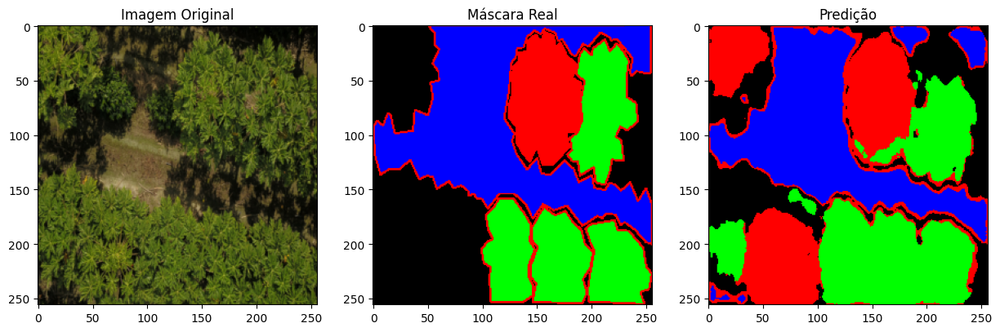

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


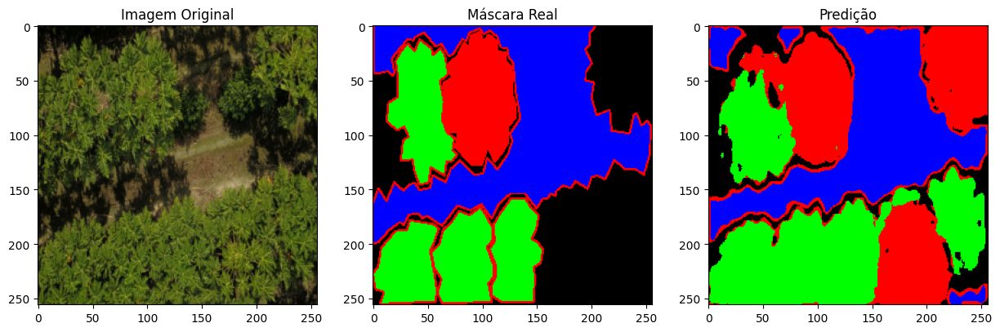

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


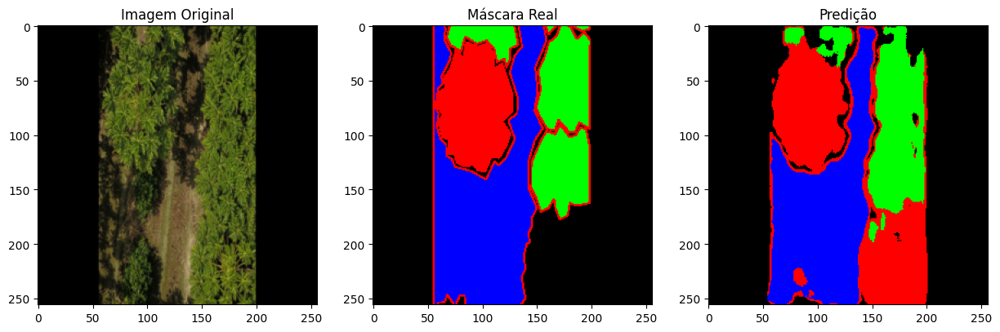

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


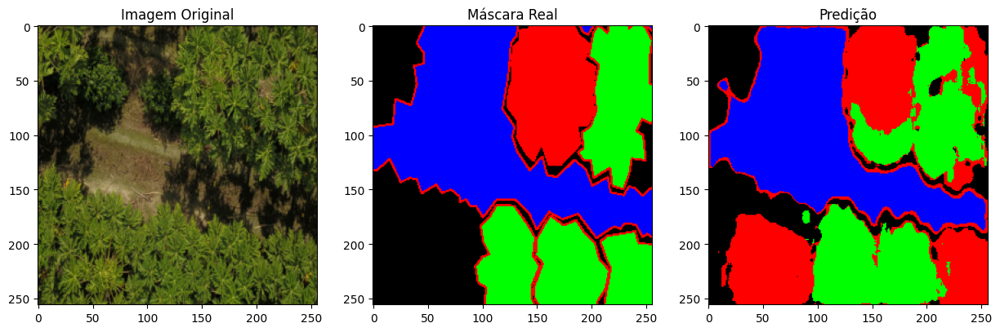

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


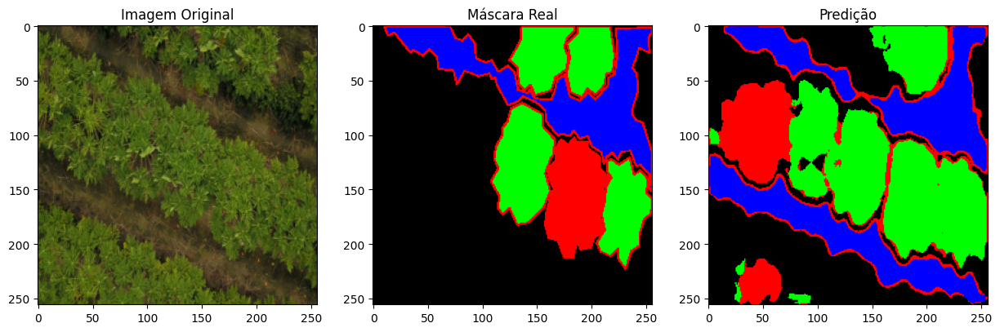

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


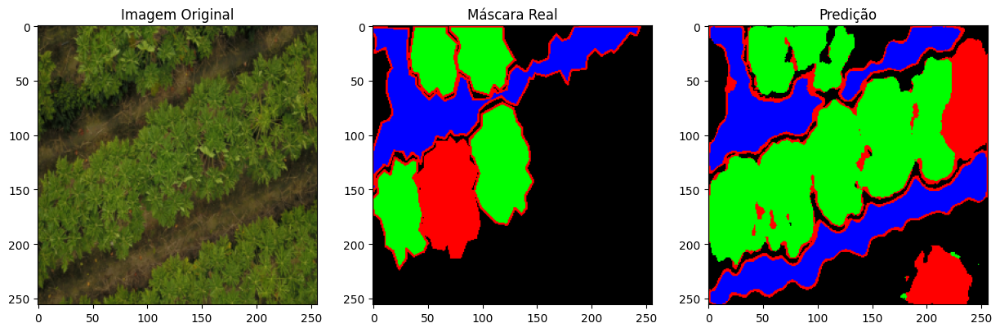

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


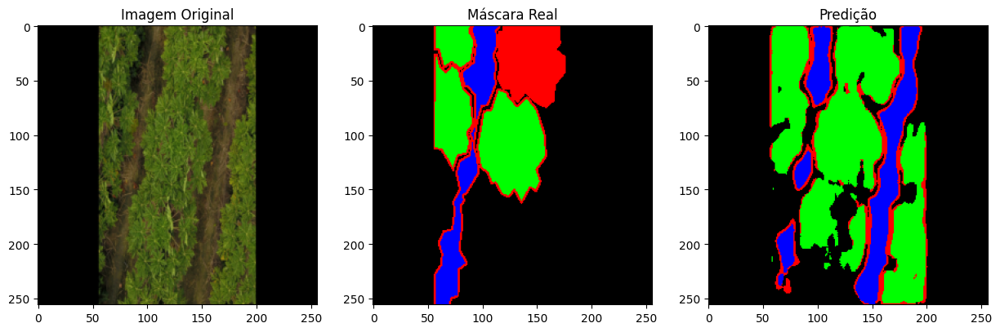

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


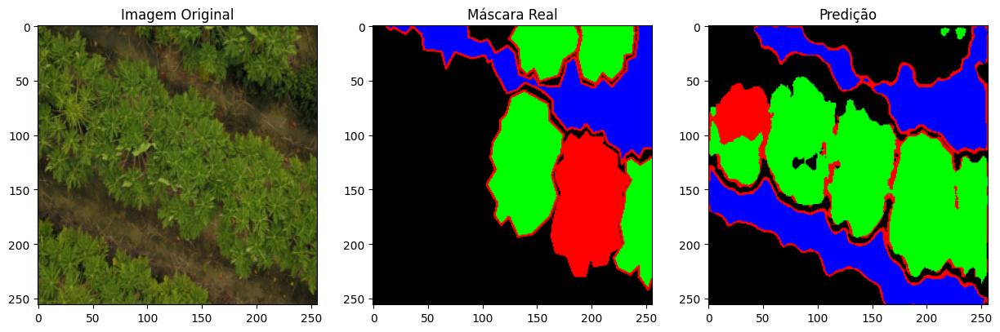

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


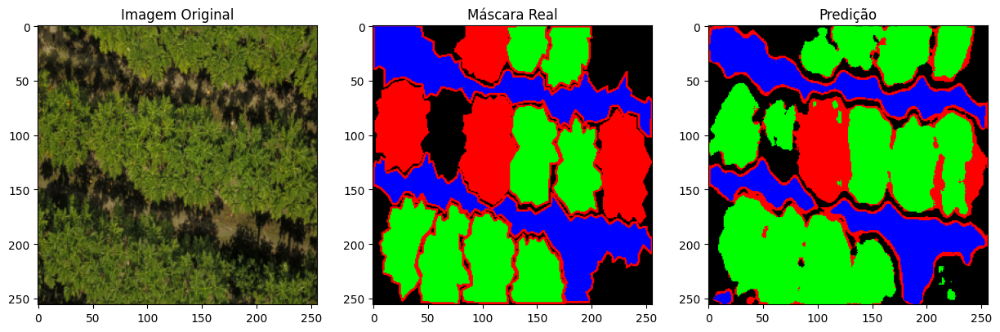

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


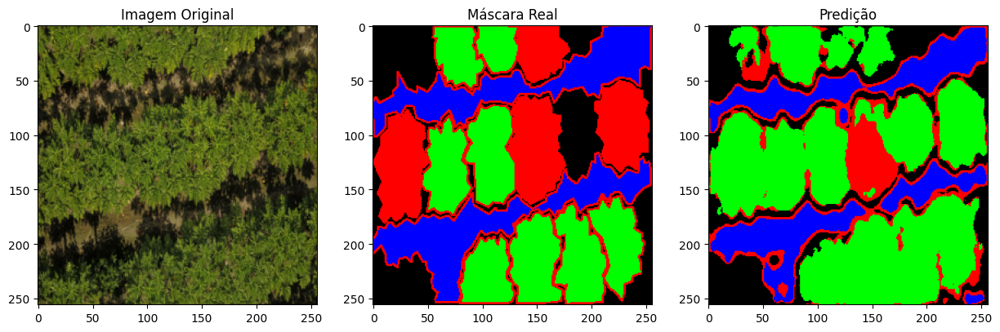

Visualizando e salvando predições para PSPNet...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


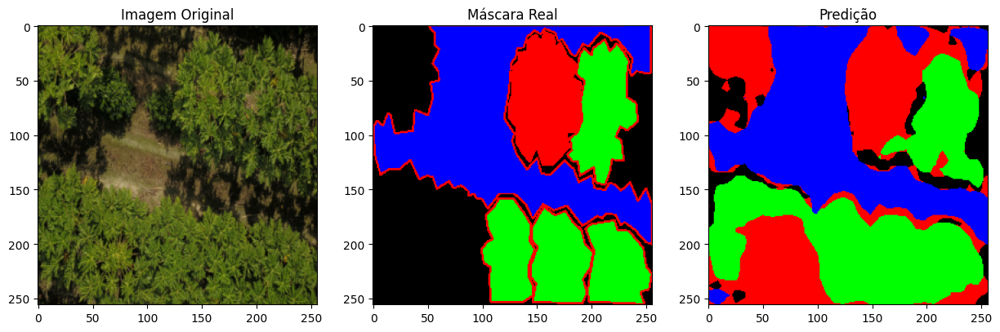

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


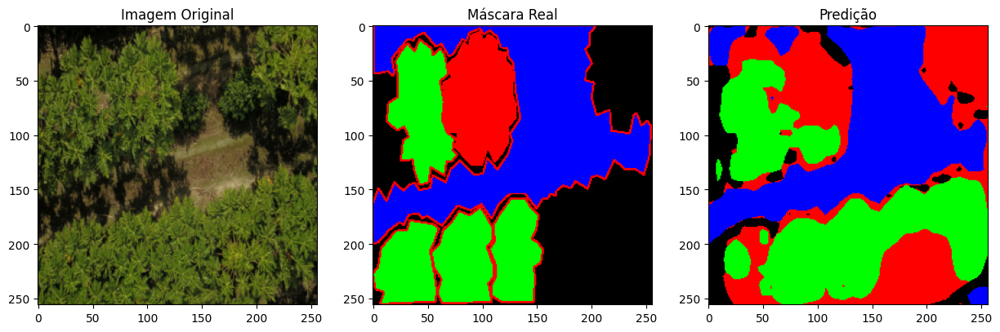

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


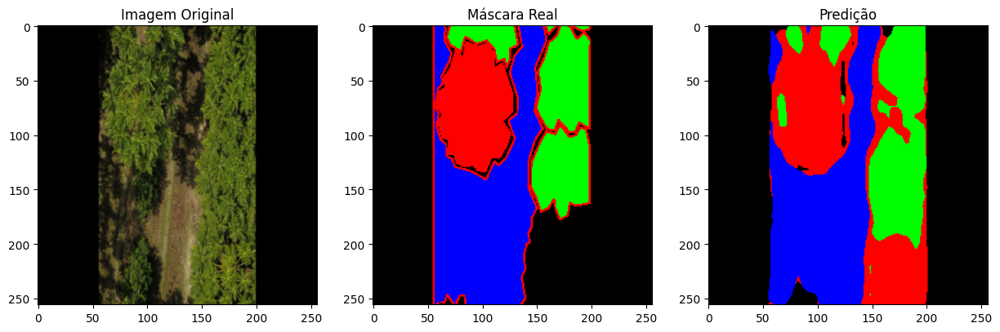

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


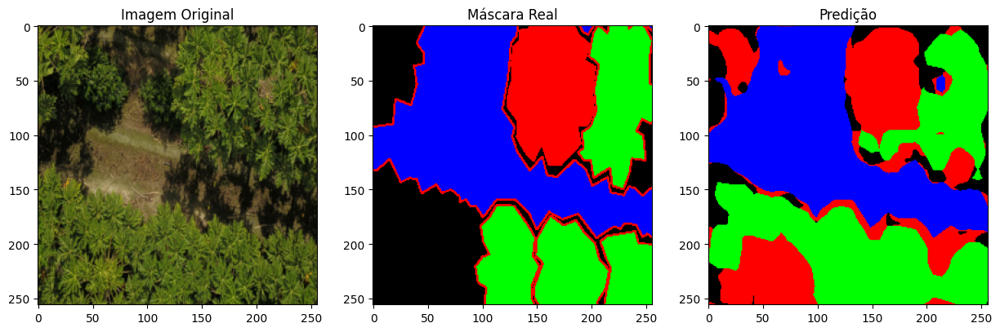

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


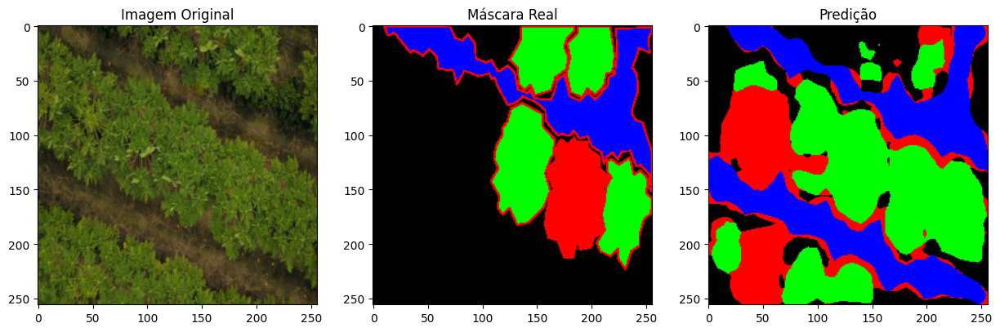

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


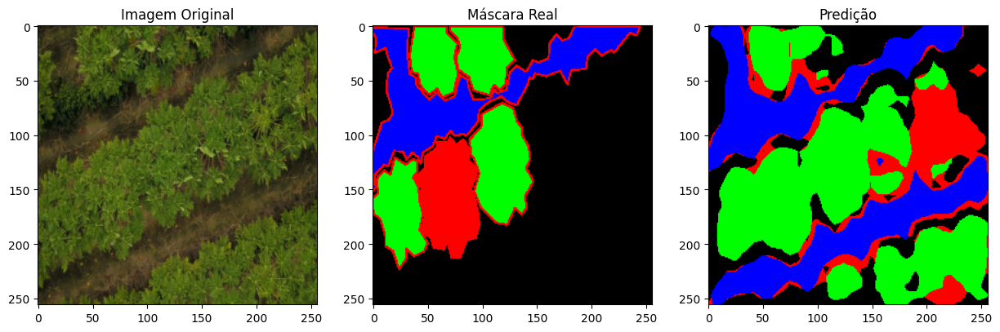

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


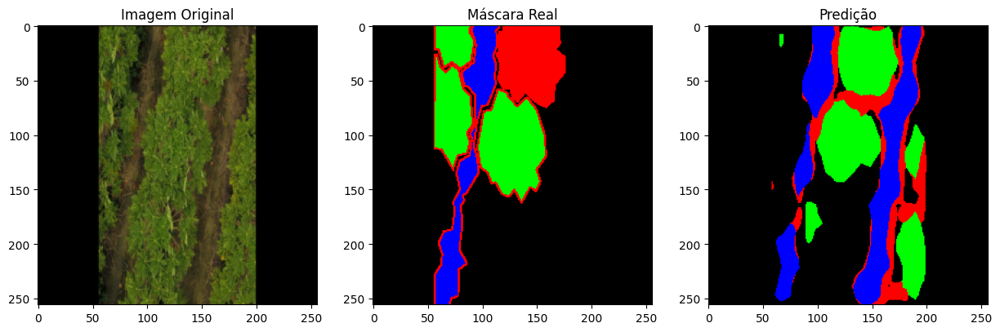

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


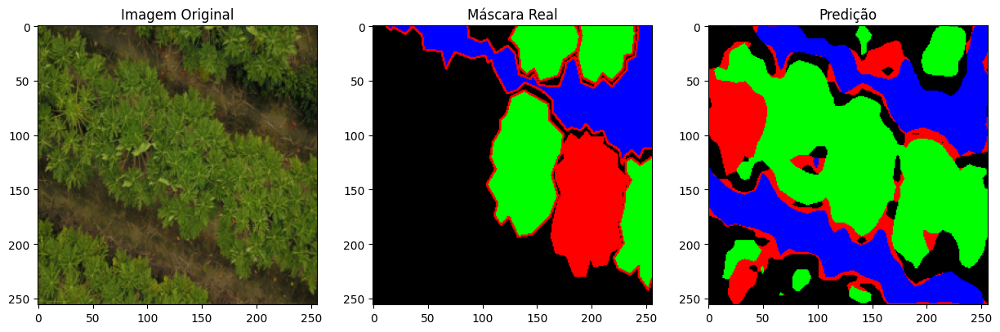

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


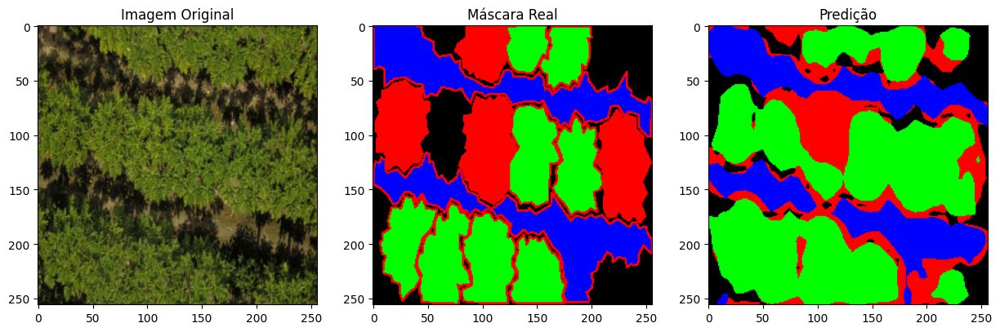

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


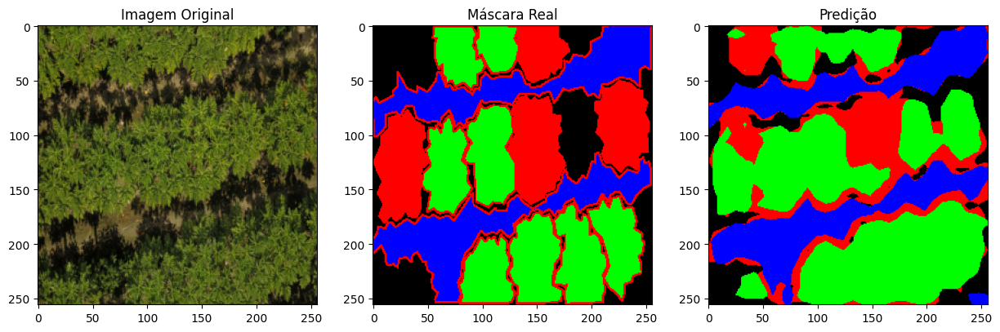

Visualizando e salvando predições para LinkNet...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


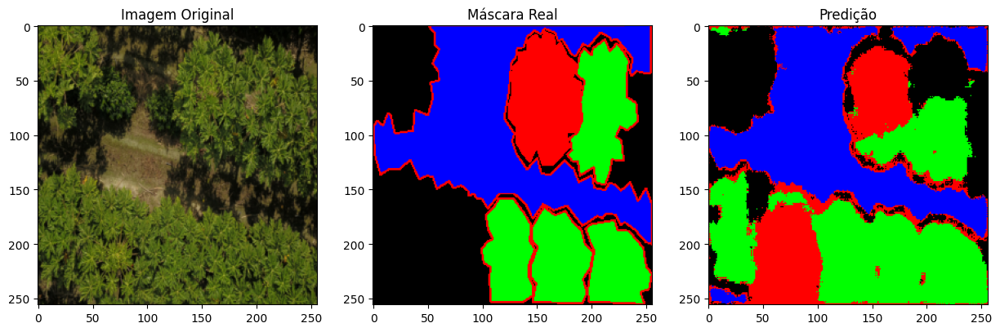

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


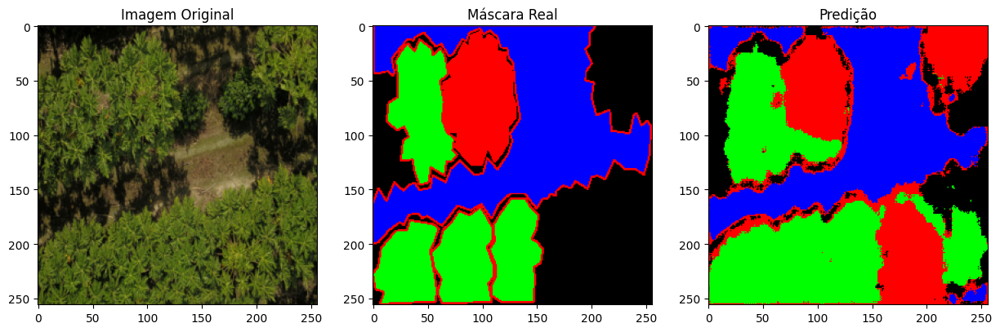

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


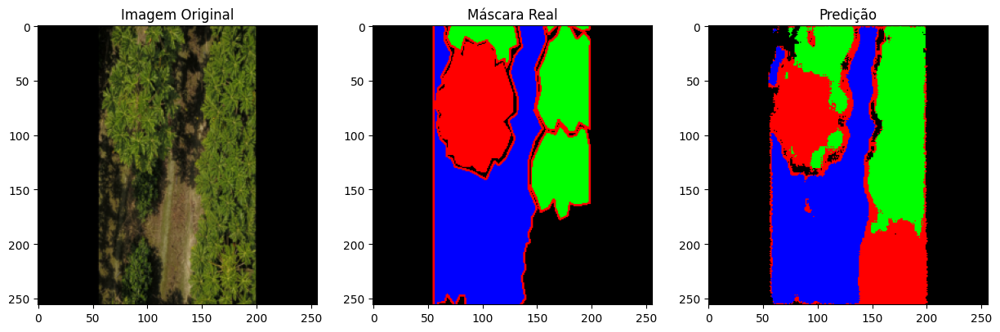

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


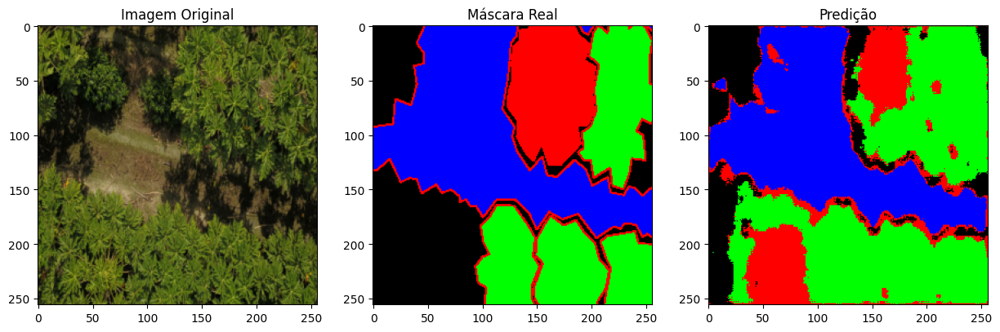

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


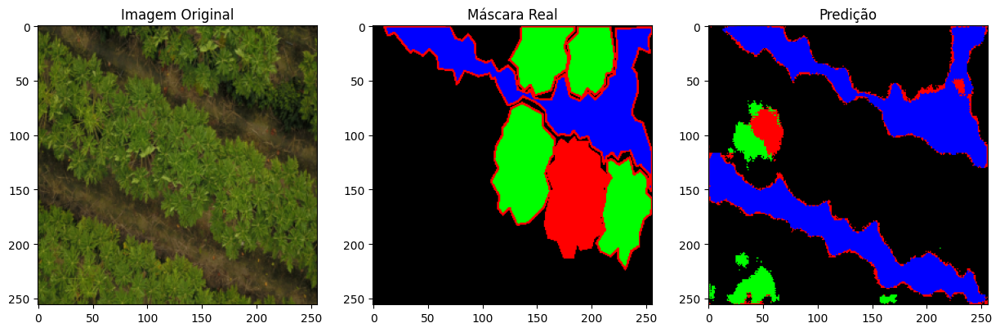

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


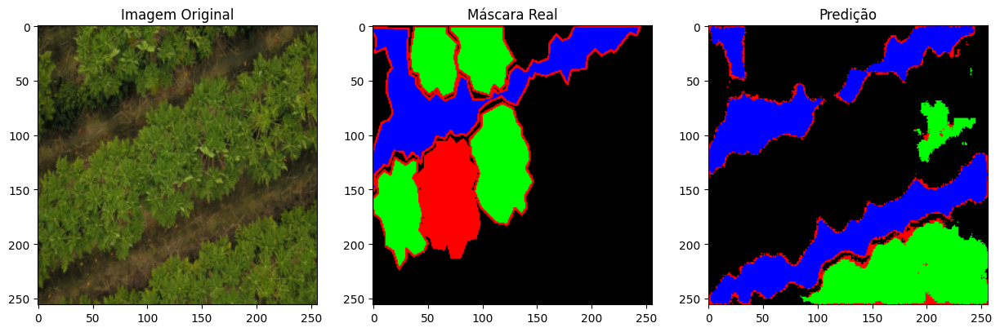

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


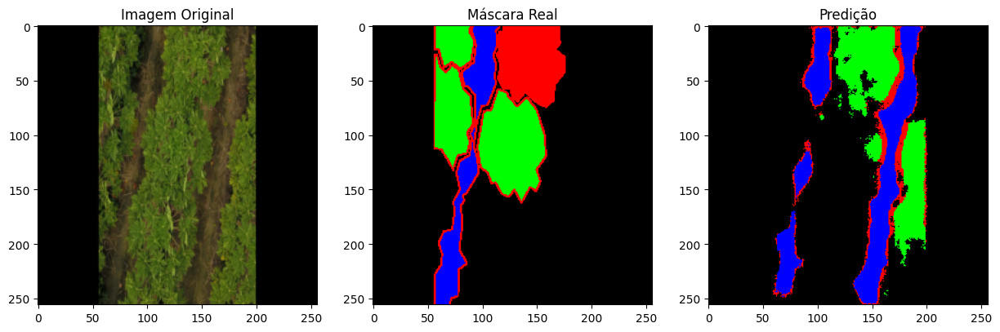

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


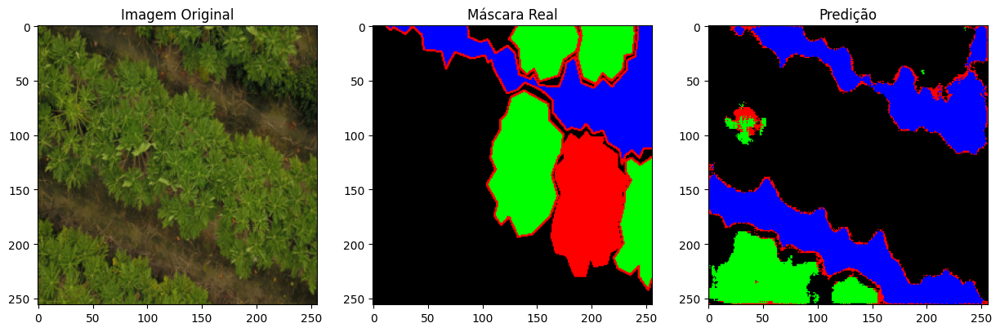

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


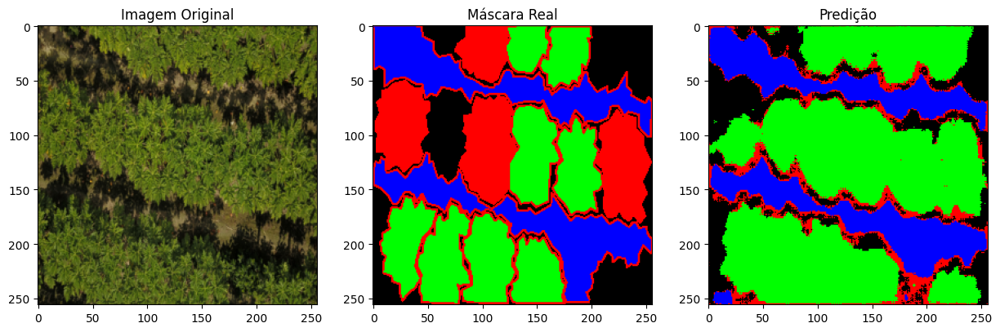

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


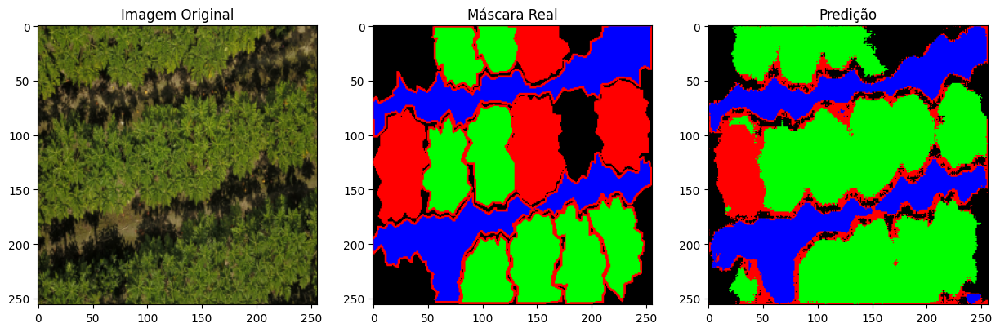

Visualizando e salvando predições para DeepLabV3...
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


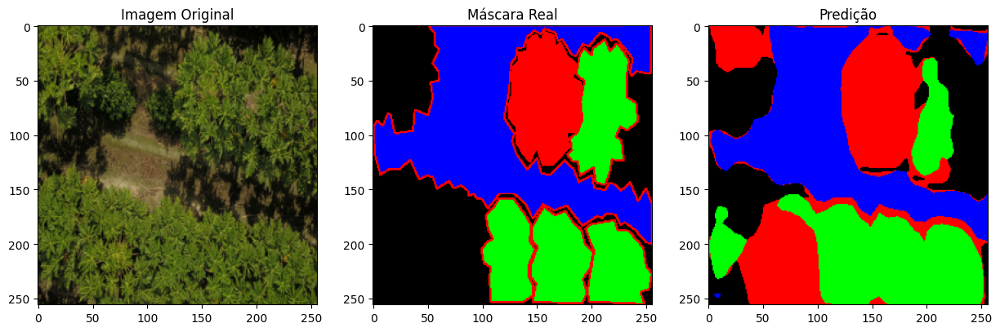

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


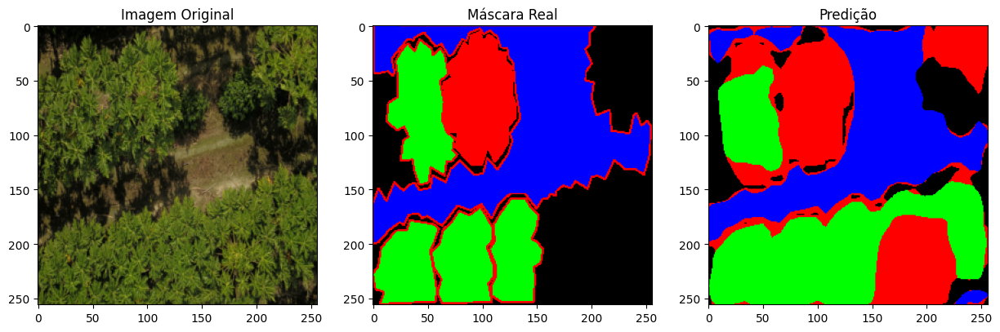

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


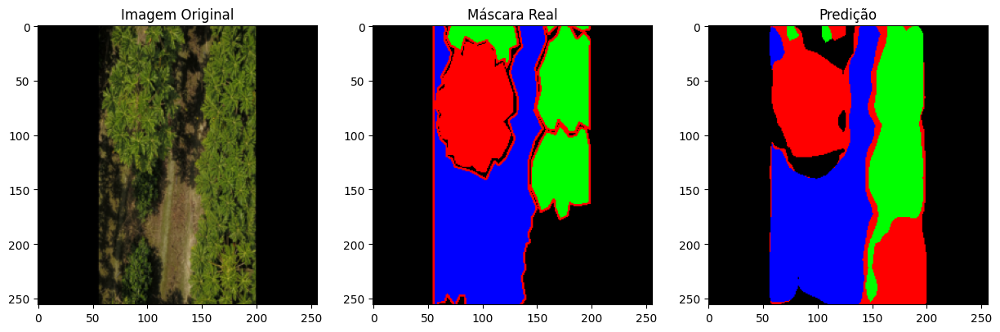

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


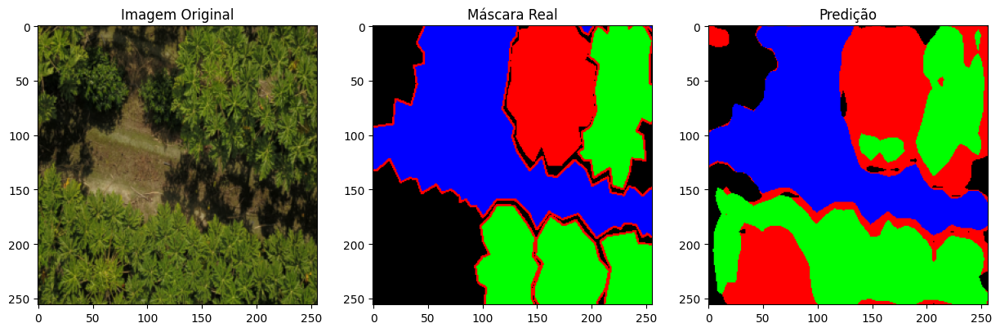

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


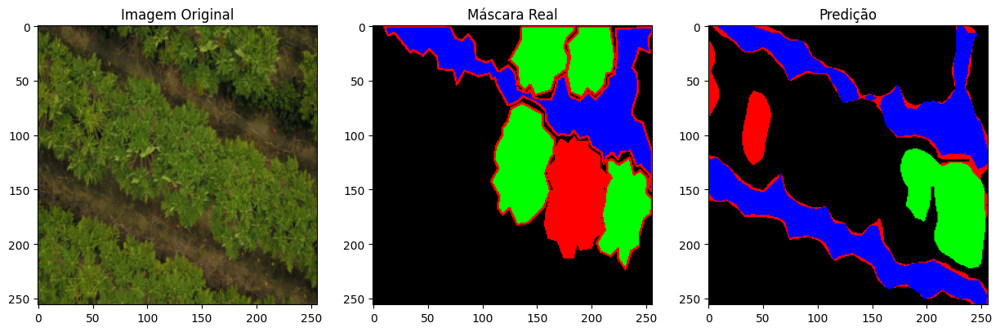

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


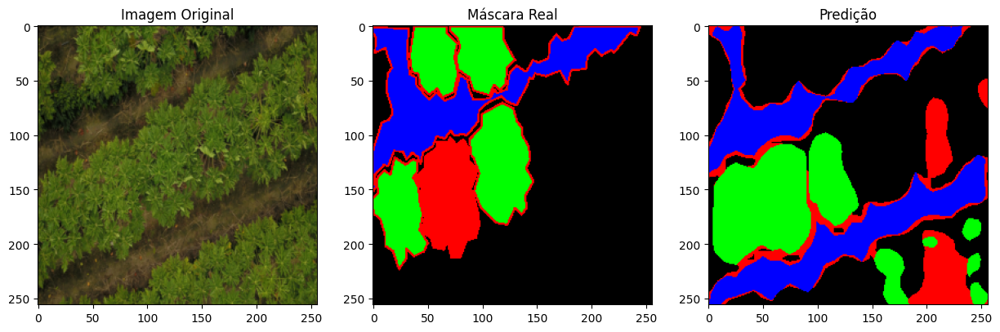

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


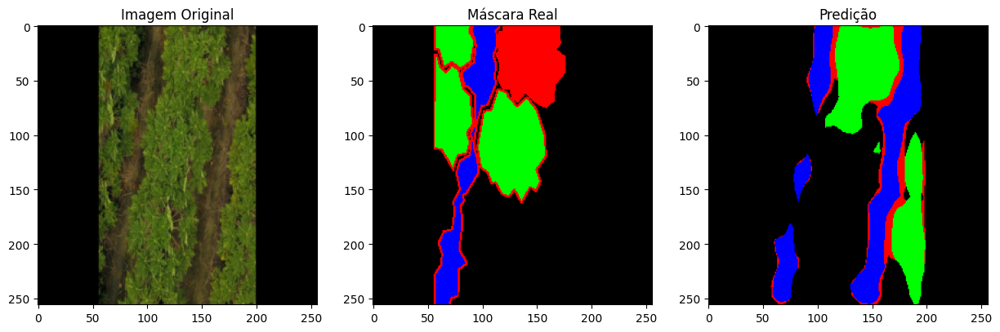

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


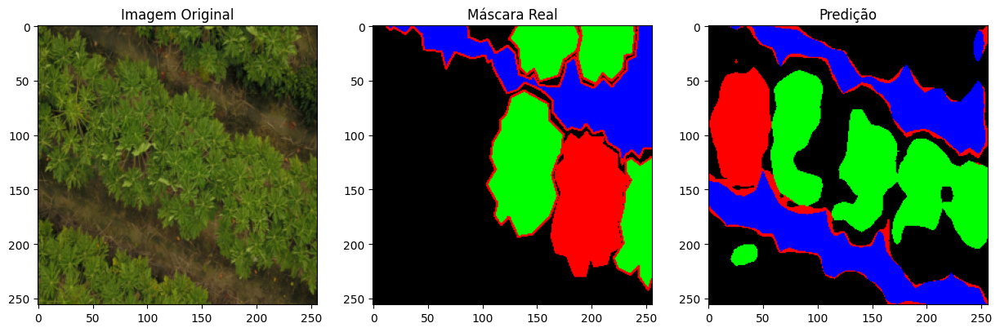

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


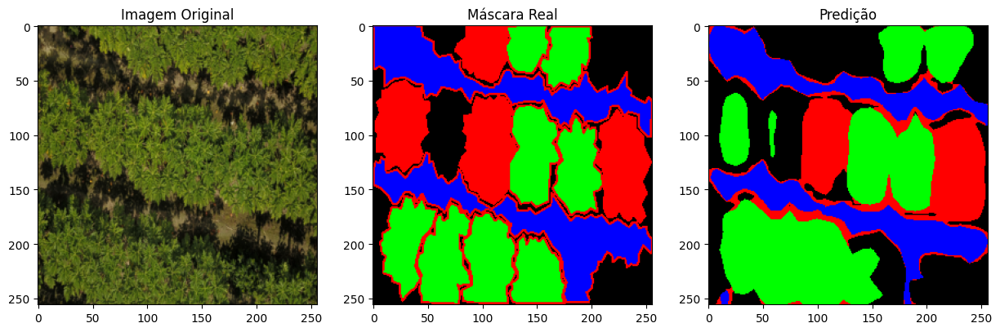

Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Unique classes in mask: [0 1 2 3]
Mapping class 0 to color (255, 0, 0)
Mapping class 1 to color (0, 255, 0)
Mapping class 2 to color (0, 0, 255)
Mapping class 3 to color (0, 0, 0)
Input shape: torch.Size([3, 256, 256])
Mask shape: torch.Size([256, 256])
Prediction shape: torch.Size([256, 256])


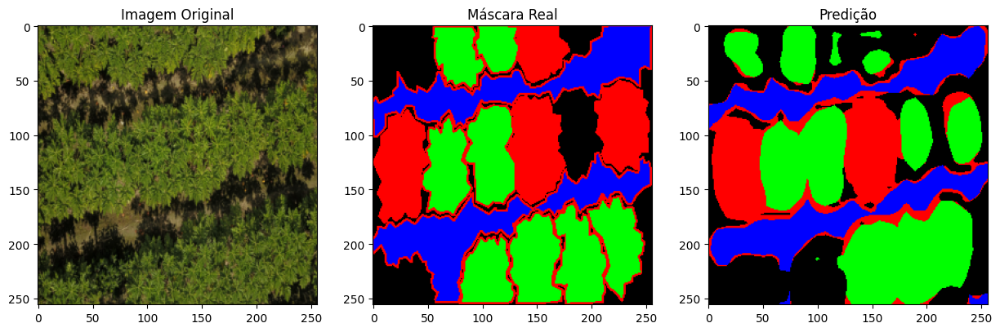

Visualização e salvamento concluídos!


In [7]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# Diretório para salvar os resultados das imagens
results_dir = "E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/results/images"
os.makedirs(results_dir, exist_ok=True)

# Diretório onde os arquivos do modelo foram salvados
model_dir = "E:/Mestrado/Materias/2024-02-Sistemas para Processamento Multimidia/seminario/image-segmentation/results/data" 

# Função auxiliar para transformar índices de classe em cores RGB
def class_to_rgb(mask_indices):
    mask_rgb = np.zeros((mask_indices.shape[0], mask_indices.shape[1], 3), dtype=np.uint8)
    unique_classes = np.unique(mask_indices)
    print(f"Unique classes in mask: {unique_classes}")  # Log para classes únicas

    for class_index, color in enumerate(CLASS_COLORS.values()):
        mask_rgb[mask_indices == class_index] = color
        print(f"Mapping class {class_index} to color {color}")  # Log para mapeamento
    return mask_rgb

# Função para visualizar e salvar predições
def visualize_and_save_predictions(model, data_loader, device, results_dir, model_name, num_images=5):
    model.eval()
    images_saved = 0

    with torch.no_grad():
        for inputs, masks in data_loader:
            inputs, masks = inputs.to(device), masks.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for i in range(inputs.size(0)):
                images_saved += 1
                if images_saved > num_images:
                    return
                
                # Processamento para visualização
                image = (inputs[i].cpu().permute(1, 2, 0).numpy() * 255).astype(np.uint8)
                
                # Conversão de índices para RGB
                mask = class_to_rgb(masks[i].cpu().numpy())
                prediction = class_to_rgb(preds[i].cpu().numpy())

                # Logs para depuração
                print(f"Input shape: {inputs[i].shape}")
                print(f"Mask shape: {masks[i].shape}")
                print(f"Prediction shape: {preds[i].shape}")

                # Visualização
                plt.figure(figsize=(15, 5))
                
                plt.subplot(1, 3, 1)
                plt.imshow(image)
                plt.title('Imagem Original')

                plt.subplot(1, 3, 2)
                plt.imshow(mask)
                plt.title('Máscara Real')

                plt.subplot(1, 3, 3)
                plt.imshow(prediction)
                plt.title('Predição')

                plt.show()
                
                # Salvar as imagens
                plt.imsave(os.path.join(results_dir, f'{model_name}_input_{images_saved}.png'), image)
                plt.imsave(os.path.join(results_dir, f'{model_name}_mask_{images_saved}.png'), mask)
                plt.imsave(os.path.join(results_dir, f'{model_name}_prediction_{images_saved}.png'), prediction)

# Executar para cada modelo
for model_name, model in models.items():
    print(f"Visualizando e salvando predições para {model_name}...")
    
    trained_model = model
    trained_model_path = os.path.join(model_dir, f'{model_name}_best.pth')
    trained_model.load_state_dict(torch.load(trained_model_path))
    trained_model.to(device)
    
    visualize_and_save_predictions(trained_model, test_loader, device, results_dir, model_name, num_images=10)

print("Visualização e salvamento concluídos!")